<div class="alert alert-block alert-success">

# **Good Reads - an analysis of the most highly rated books from the last 100 years, in order to recommend future reads**

**Catherine Williams**      
**March 2023** 

![Good Reads logo](https://s2982.pcdn.co/wp-content/uploads/2015/12/goodreads-e1457555424780.jpg.webp)

#### *The dataset has been taken from the Goodreads API via Kaggle and contains 11127 unique ISBNs and 10352 unique titles within 13 columns, which include publication dates, average ratings and text review counts. All of the books were published between 1900 and 2000. My intention is to analyse the data and, using a number of models, find the optimal number of clusters for the data, in order to recommend similar books.* 


   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist"></div>


# <p style="padding:10px;background-color:#ffffff;margin:0;color:#78eab5;font-family:Courier New;font-size:120%;text-align:left;border-radius: 15px 50px;overflow:hidden;font-weight:1000"> Table of Contents </p>
    
    
* [1. Importing and Viewing the Dataset](#1)
    
* [2. Data Cleaning](#2)
    * Splitting out the authors
  
* [3. EDA](#3)

* [4. Univariate Analysis](#4)
    * Focussing on English language/ US language reads
    * Correlation
    * Analysis by ratings_count and by average_rating
    * Analysis by authors
    * Average rating is greater than 4.0
    * Modern Reads
    * Checking for outliers

* [5. Bivariate Analysis](#5)

* [6. Data prep for modelling](#6)
    * Standardising the values
    
* [7. Model Building](#7)
    * Clustering using KMeans: The Elbow Method
    * Cluster level Analysis
    * Generalised KMeans using KMeans++
    * Hierarchical Clustering
    * Implementing the model

* [8. Recommender](#8)
    
* [9. Streamlit](#9)

## Data Dictionary

*  *bookID:*        	           A unique identification number for each book
*  *title:*          	               The name under which the book was published
*  *authors:*        	           Names of the authors of the book. Multiple authors are delimited with /.
*  *average_rating:* 	     The average rating of the book received in total.
*  *isbn:*          	              Another unique number to identify the book, the International Standard Book Number.
*  *isbn13:*         	            A 13-digit ISBN to identify the book, instead of the standard 11-digit ISBN.
*  *language_code:*  	   Helps understand what is the primary language of the book. For instance, eng is standard for English.
*  *num_pages:*      	      Number of pages the book contains.
*  *ratings_count:*  	      Total number of ratings the book received.
*  *text_reviews_count:*  Total number of written text reviews the book received.
*  *publication_date:* 	     Date when the book was first published.
*  *publisher:*     	          The name of the publisher.


<a id="1"></a>
# <p style="padding:10px;background-color:#ffffff;margin:0;color:#78eab5;font-family:Courier New;font-size:120%;text-align:left;border-radius: 15px 50px;overflow:hidden;font-weight:1000"> Importing and Viewing the Dataset </p>

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use("fivethirtyeight")


from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram


from sklearn.pipeline import Pipeline
from sklearn import metrics
from sklearn import preprocessing

from IPython.display import HTML
import pickle
import os
# print(os.getcwd())

import warnings
warnings.filterwarnings('ignore')

In [231]:
#df = pd.read_csv('Goodreads.csv', parse_dates=['publication_date'], dayfirst = True)
df = pd.read_csv('https://raw.githubusercontent.com/CatherineWilliams8/data/main/Goodreads.csv', parse_dates=['publication_date'], dayfirst = True)

In [3]:
#orig_df = df  # in case something goes wrong

In [4]:
df.head()

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher,Unnamed: 12
0,1,Harry Potter and the Half-Blood Prince (Harry ...,J.K. Rowling/Mary GrandPré,4.57,439785960,9780439785969,eng,652,2095690,27591,9/16/2006,Scholastic Inc.,NaN
1,2,Harry Potter and the Order of the Phoenix (Har...,J.K. Rowling/Mary GrandPré,4.49,439358078,9780439358071,eng,870,2153167,29221,09/01/2004,Scholastic Inc.,NaN
2,4,Harry Potter and the Chamber of Secrets (Harry...,J.K. Rowling,4.42,439554896,9780439554893,eng,352,6333,244,11/01/2003,Scholastic,NaN
3,5,Harry Potter and the Prisoner of Azkaban (Harr...,J.K. Rowling/Mary GrandPré,4.56,043965548X,9780439655484,eng,435,2339585,36325,05/01/2004,Scholastic Inc.,NaN
4,8,Harry Potter Boxed Set Books 1-5 (Harry Potte...,J.K. Rowling/Mary GrandPré,4.78,439682584,9780439682589,eng,2690,41428,164,9/13/2004,Scholastic,NaN


In [5]:
df.shape

(11127, 13)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11127 entries, 0 to 11126
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   bookID              11127 non-null  int64 
 1   title               11127 non-null  object
 2   authors             11127 non-null  object
 3   average_rating      11127 non-null  object
 4   isbn                11127 non-null  object
 5   isbn13              11127 non-null  object
 6   language_code       11127 non-null  object
 7   num_pages           11127 non-null  object
 8   ratings_count       11127 non-null  int64 
 9   text_reviews_count  11127 non-null  int64 
 10  publication_date    11127 non-null  object
 11  publisher           11127 non-null  object
 12  Unnamed: 12         4 non-null      object
dtypes: int64(3), object(10)
memory usage: 1.1+ MB


In [7]:
#unique titles
df['title'].nunique()

10352

In [8]:
#unique authors
df['authors'].nunique()

6643

<a id="2"></a>
# <p style="padding:10px;background-color:#ffffff;margin:0;color:#78eab5;font-family:Courier New;font-size:120%;text-align:left;border-radius: 15px 50px;overflow:hidden;font-weight:1000"> Data Cleaning </p>

In [9]:
#error with 4 rows, where ISBN has fallen into the language code column
df.groupby('language_code').count()

,bookID,title,authors,average_rating,isbn,isbn13,num_pages,ratings_count,text_reviews_count,publication_date,publisher,Unnamed: 12
language_code,,,,,,,,,,,,
9.78067E+12,1,1,1,1,1,1,1,1,1,1,1,1
9.78085E+12,1,1,1,1,1,1,1,1,1,1,1,1
9.78156E+12,1,1,1,1,1,1,1,1,1,1,1,1
9.78159E+12,1,1,1,1,1,1,1,1,1,1,1,1
ale,1,1,1,1,1,1,1,1,1,1,1,0
ara,1,1,1,1,1,1,1,1,1,1,1,0
en-CA,7,7,7,7,7,7,7,7,7,7,7,0
en-GB,214,214,214,214,214,214,214,214,214,214,214,0
en-US,1408,1408,1408,1408,1408,1408,1408,1408,1408,1408,1408,0


In [10]:
#delete the corresponding rows in order that the pulication_date column can be converted into date time format.
df = df.query('language_code != "9.78067E+12"')
df = df.query('language_code != "9.78085E+12"')
df = df.query('language_code != "9.78156E+12"')
df = df.query('language_code != "9.78159E+12"')

In [11]:
#check rows have been removed
#df.groupby('language_code').count()

In [12]:
#convert num_pages to an integer
df[['num_pages']] = df[['num_pages']].astype(str).astype(int)

In [13]:
#convert average_rating to a float
df[['average_rating']] = df[['average_rating']].astype(str).astype(float)

In [14]:
#convert publication date to datetime format.  A number of dates won't convert as days incorrect for month.
#use 'errors='coerce'' to give value NaT for these.
df['publication_date'] = pd.to_datetime(df['publication_date'], infer_datetime_format=True, errors='coerce').copy()

In [15]:
#successfully changed
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11123 entries, 0 to 11126
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   bookID              11123 non-null  int64         
 1   title               11123 non-null  object        
 2   authors             11123 non-null  object        
 3   average_rating      11123 non-null  float64       
 4   isbn                11123 non-null  object        
 5   isbn13              11123 non-null  object        
 6   language_code       11123 non-null  object        
 7   num_pages           11123 non-null  int32         
 8   ratings_count       11123 non-null  int64         
 9   text_reviews_count  11123 non-null  int64         
 10  publication_date    11121 non-null  datetime64[ns]
 11  publisher           11123 non-null  object        
 12  Unnamed: 12         0 non-null      object        
dtypes: datetime64[ns](1), float64(1), int32(1), in

In [16]:
#remove those rows where publication_date is NaT
df = df.query('publication_date != "NaT"')

In [17]:
#New shape with 6 rows removed.
df.shape

(11121, 13)

In [18]:
#Check missing values.  Need to remove 'Unamed' column as actually empty. Also look to remove other unnecessary columns.
df.isna().sum()

bookID                    0
title                     0
authors                   0
average_rating            0
isbn                      0
isbn13                    0
language_code             0
num_pages                 0
ratings_count             0
text_reviews_count        0
publication_date          0
publisher                 0
Unnamed: 12           11121
dtype: int64

In [19]:
#Check for duplicates = zero therefore no duplicated rows
df.duplicated().sum()

0

In [20]:
#Check for duplicated titles = 775, these could be re-publications of the same book or books on a similar theme
df.duplicated('title').sum()

775

In [21]:
#describe numerical columns.
df.describe().round(2)

,bookID,average_rating,num_pages,ratings_count,text_reviews_count
count,11121.00,11121.00,11121.00,11121.00,11121.00
mean,21307.77,3.93,336.34,17945.12,542.12
std,13093.54,0.35,241.13,112509.12,2576.85
min,1.00,0.00,0.00,0.00,0.00
25%,10270.00,3.77,192.00,104.00,9.00
50%,20264.00,3.96,299.00,745.00,47.00
75%,32104.00,4.14,416.00,4996.00,238.00
max,45641.00,5.00,6576.00,4597666.00,94265.00


In [22]:
df.describe(include = 'object')

,title,authors,isbn,isbn13,language_code,publisher,Unnamed: 12
count,11121,11121,11121,11121,11121,11121,0
unique,10346,6638,11121,11121,27,2289,0
top,The Brothers Karamazov,P.G. Wodehouse,439785960,9780439785969,eng,Vintage,NaN
freq,9,40,1,1,8907,318,NaN


In [23]:
#Need to remove 'Unnamed: 12' column as actually empty. Also look to remove other unnecessary columns, such as first isbn (10 digit).
df.drop(columns=["isbn", "Unnamed: 12"])

,bookID,title,authors,average_rating,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher
0,1,Harry Potter and the Half-Blood Prince (Harry ...,J.K. Rowling/Mary GrandPré,4.57,9780439785969,eng,652,2095690,27591,2006-09-16,Scholastic Inc.
1,2,Harry Potter and the Order of the Phoenix (Har...,J.K. Rowling/Mary GrandPré,4.49,9780439358071,eng,870,2153167,29221,2004-09-01,Scholastic Inc.
2,4,Harry Potter and the Chamber of Secrets (Harry...,J.K. Rowling,4.42,9780439554893,eng,352,6333,244,2003-11-01,Scholastic
3,5,Harry Potter and the Prisoner of Azkaban (Harr...,J.K. Rowling/Mary GrandPré,4.56,9780439655484,eng,435,2339585,36325,2004-05-01,Scholastic Inc.
4,8,Harry Potter Boxed Set Books 1-5 (Harry Potte...,J.K. Rowling/Mary GrandPré,4.78,9780439682589,eng,2690,41428,164,2004-09-13,Scholastic
...,...,...,...,...,...,...,...,...,...,...,...
11122,45631,Expelled from Eden: A William T. Vollmann Reader,William T. Vollmann/Larry McCaffery/Michael He...,4.06,9781560254416,eng,512,156,20,2004-12-21,Da Capo Press
11123,45633,You Bright and Risen Angels,William T. Vollmann,4.08,9780140110876,eng,635,783,56,1988-12-01,Penguin Books
11124,45634,The Ice-Shirt (Seven Dreams #1),William T. Vollmann,3.96,9780140131963,eng,415,820,95,1993-08-01,Penguin Books
11125,45639,Poor People,William T. Vollmann,3.72,9780060878825,eng,434,769,139,2007-02-27,Ecco


In [24]:
#extract year
df['year']=df['publication_date'].dt.year

In [25]:
#extract month
df['month']=df['publication_date'].dt.month

In [26]:
#extract month 
df['month_name']=df['publication_date'].dt.month_name()

In [33]:
#df.head()

### Splitting out the authors

In [27]:
#sample shows authors in a list separated by /
df['authors'].sample(20)

7832                                            P.C. Cast
6406                        Leonardo da Vinci/H. Anna Suh
2351                                         Dick Francis
9320    David Wojnarowicz/James Romberger/Marguerite V...
5554                                         Charles Todd
8183                                     Elizabeth George
8370                                     Rumiko Takahashi
892                                      Daniel Defoe/Avi
3264                                      Jack Williamson
1293                                        Ruby K. Payne
2453                           Arthur Conan Doyle/Pam Smy
9289                 Cynthia J. Arnson/I. William Zartman
705                                       Margaret Truman
8436                                          Dean Koontz
2055                            Juan Bonilla/Esther Allen
4219                                      Stephen Rebello
2614                                    Kurt Vonnegut Jr.
347           

In [28]:
# create a copy of the dataframe as the explode will create a number of new entries, skewing the dataset
auth_df = df.copy() #A deep copy
auth_df["authors"]= auth_df["authors"].str.split("/", n = -1, expand = False)
auth_df = auth_df.explode('authors')
auth_df.head()

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher,Unnamed: 12,year,month,month_name
0,1,Harry Potter and the Half-Blood Prince (Harry ...,J.K. Rowling,4.57,439785960,9780439785969,eng,652,2095690,27591,2006-09-16,Scholastic Inc.,NaN,2006,9,September
0,1,Harry Potter and the Half-Blood Prince (Harry ...,Mary GrandPré,4.57,439785960,9780439785969,eng,652,2095690,27591,2006-09-16,Scholastic Inc.,NaN,2006,9,September
1,2,Harry Potter and the Order of the Phoenix (Har...,J.K. Rowling,4.49,439358078,9780439358071,eng,870,2153167,29221,2004-09-01,Scholastic Inc.,NaN,2004,9,September
1,2,Harry Potter and the Order of the Phoenix (Har...,Mary GrandPré,4.49,439358078,9780439358071,eng,870,2153167,29221,2004-09-01,Scholastic Inc.,NaN,2004,9,September
2,4,Harry Potter and the Chamber of Secrets (Harry...,J.K. Rowling,4.42,439554896,9780439554893,eng,352,6333,244,2003-11-01,Scholastic,NaN,2003,11,November


In [29]:
auth_df['authors'].sample(20) # explode function has worked

4447              John Milton
7826                P.C. Cast
3267            Anthony Bower
5544         James Scott Bell
10302           Clive Cussler
2975         William Faulkner
160             Douglas Adams
7595        Robert Silverberg
10882          David Friedman
5897                Jeff Long
6710            Martha Grimes
178            Thomas Pynchon
1805                    Plato
160          Christopher Cerf
10627      Mary Higgins Clark
10438           Frank Herbert
8727     Madonna J. Hettinger
7905             Sandra Brown
3037                Ken Kesey
4416            Mary GrandPré
Name: authors, dtype: object

<a id="3"></a>
# <p style="padding:10px;background-color:#ffffff;margin:0;color:#78eab5;font-family:Courier New;font-size:120%;text-align:left;border-radius: 15px 50px;overflow:hidden;font-weight:1000"> Exploratory Data Analysis </p>

<a id="4"></a>
# <p style="padding:10px;background-color:#ffffff;margin:0;color:#78eab5;font-family:Courier New;font-size:120%;text-align:left;border-radius: 15px 50px;overflow:hidden;font-weight:1000"> Univariate Analysis </p>

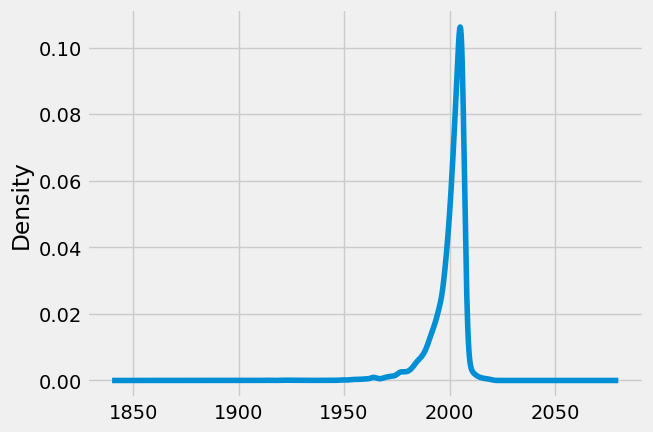

In [30]:
#publication year - initial look at most frequent year of publications in all languages
df['year'].plot(kind = 'kde');

In [31]:
df.groupby('language_code')['title'].count()

language_code
ale         1
ara         1
en-CA       7
en-GB     214
en-US    1408
eng      8907
enm         3
fre       143
ger        99
gla         1
glg         1
grc        11
ita         5
jpn        46
lat         3
msa         1
mul        19
nl          1
nor         1
por        10
rus         2
spa       218
srp         1
swe         2
tur         1
wel         1
zho        14
Name: title, dtype: int64

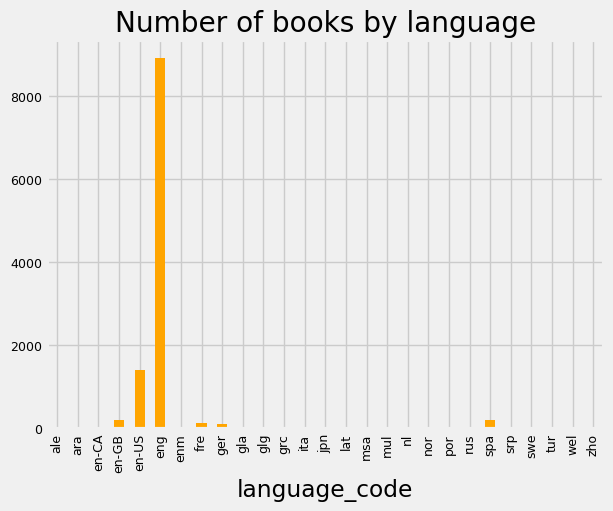

<Figure size 1000x2000 with 0 Axes>

In [34]:
#Visualised
graph = df.groupby('language_code')['title'].count()
bargraph = graph. plot. bar(x = 'language_code', y = 'title', 
                         fontsize='9', title='Number of books by language', legend = False, color = 'orange') 
plt.figure(figsize=(10, 20));

# due to the scaling, any countries with books less than 99 don't appear to be showing.

### Focusing on English/ US language reads

In [35]:
df['language_code'] = df['language_code'].replace(['en-CA', 'en-GB', 'en-US', 'eng'],1)

df['language_code'] = df['language_code'].replace(['zho','wel','tur','swe','srp','spa','rus','por','nor','nl','mul','msa','lat','jpn','ita','grc','glg','gla','ger','fre','enm','ara','ale'],0)
#df.head(150)

In [36]:
df['language_code'].value_counts(normalize= True).to_frame().style.format('{:.2%}')
# 0 = not English language
# 1 = English language
# only 5% not English language books, so happy to drop the rows as foccusing on recommendations for UK market

,language_code
1,94.74%
0,5.26%


In [37]:
Eng = [0]
df = df[~df['language_code'].isin(Eng)]
#df.head(150)
df.shape

(10536, 16)

In [38]:
df.groupby('year')['title'].count()
#data spans from 1900 to 2020.  How best to split the data?  Decades?  Modern v Classical?

year
1900    1
1913    1
1923    1
1925    2
1928    1
       ..
2016    5
2017    7
2018    3
2019    6
2020    1
Name: title, Length: 83, dtype: int64

### Correlation

<AxesSubplot:>

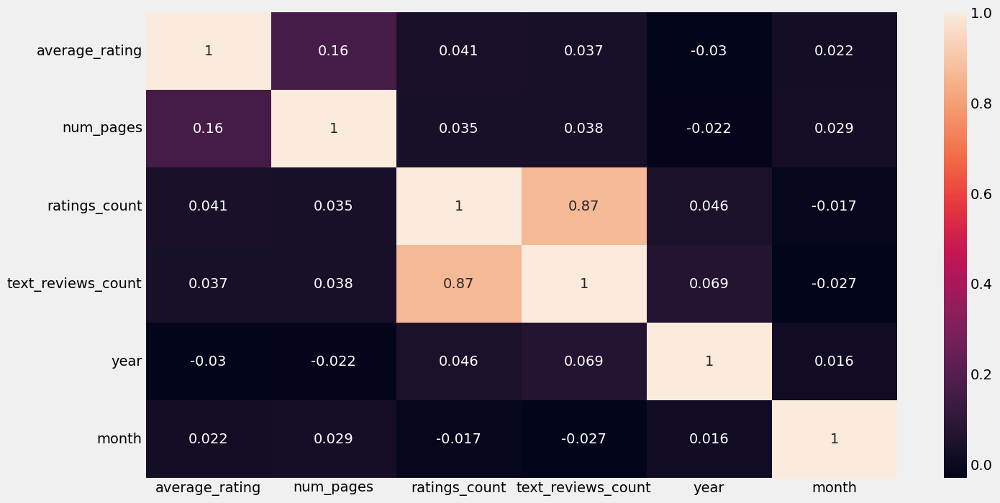

In [39]:
drop_cols = ['bookID', 'isbn', 'isbn13', 'language_code', 'Unnamed: 12', 'publication_date']
corr = df.drop(columns = drop_cols, axis = 1).corr().round(3)
plt.figure(figsize= (15,8))
sns.heatmap(corr, annot=True)

#only correlation seems to be between ratings_count and text_reviews_count. No correlation between no pages, publicatione yr etc

### Analysis by ratings_count and average_rating

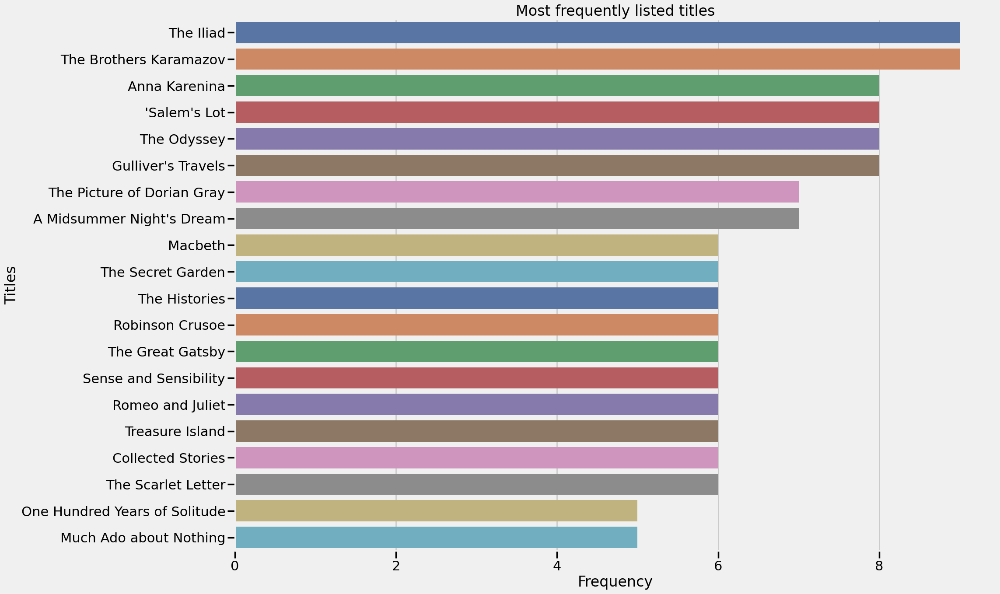

In [40]:
#show the frequently listed titles in the full dataset.  The majority of these seem to be 'classics'
sns.set_context('poster')
plt.figure(figsize=(20,15))
books = df['title'].value_counts()[:20]
rating = df.average_rating[:20]
sns.barplot(x = books, y = books.index, palette='deep')
plt.title("Most frequently listed titles")
plt.xlabel("Frequency")
plt.ylabel("Titles")
plt.show()

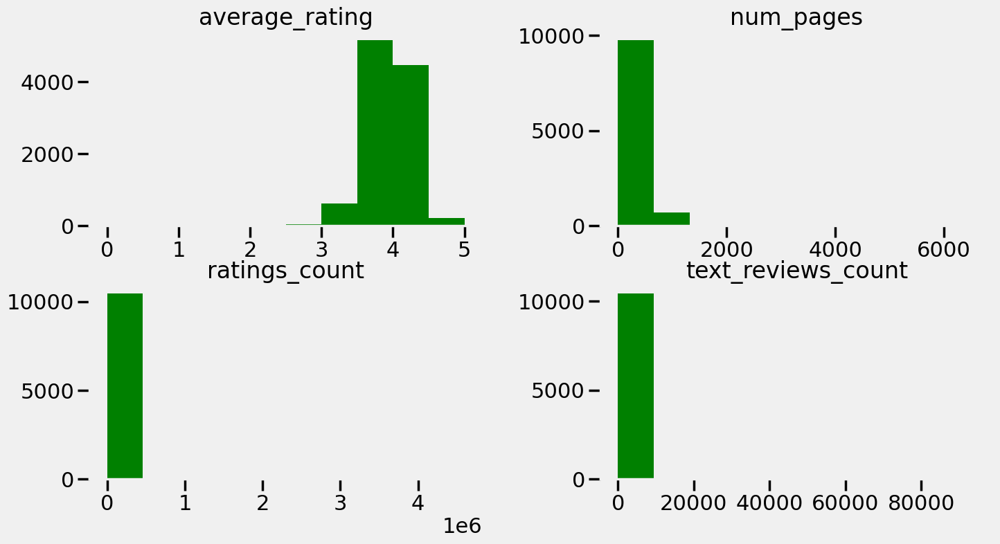

In [41]:
key_columns = ['average_rating', 'num_pages', 'ratings_count', 'text_reviews_count']
df[key_columns].hist(grid = False, color = 'green', figsize = (15,8));


array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
      dtype=object)

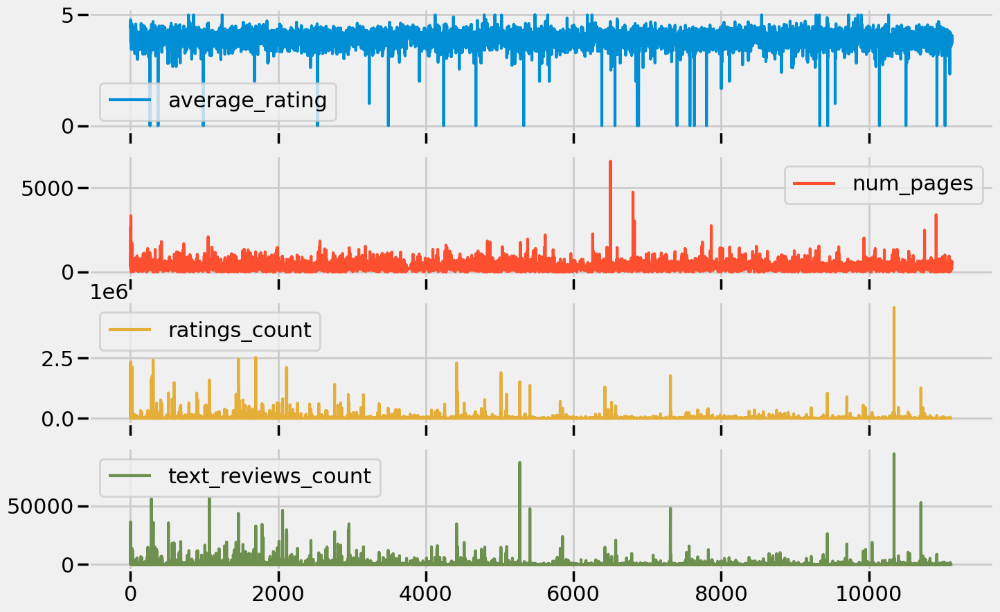

In [42]:
df[key_columns].plot(kind = 'line', subplots = True, figsize = (15,10))
# below we can see where certain books (row ID across the x axis) correlate in terms of text_reviews_count and ratings_count
# inparticularly a book around the 10500 mark, which looks to be an outlier in terms of these variables.

In [43]:
# most popular in terms of number ratings
df.sort_values(by = 'ratings_count', ascending= False).head(10)
# it looks to be that 'Twilight' is the book in question that we could see at line 10340 above, with over 2million more ratings
# than it's nearest neighbour.

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher,Unnamed: 12,year,month,month_name
10340,41865,Twilight (Twilight #1),Stephenie Meyer,3.59,316015849,9780316015844,1,501,4597666,94265,2006-09-06,Little Brown and Company,NaN,2006,9,September
1697,5907,The Hobbit or There and Back Again,J.R.R. Tolkien,4.27,618260307,9780618260300,1,366,2530894,32871,2002-08-15,Houghton Mifflin,NaN,2002,8,August
1462,5107,The Catcher in the Rye,J.D. Salinger,3.80,316769177,9780316769174,1,277,2457092,43499,2001-01-30,Back Bay Books,NaN,2001,1,January
307,960,Angels & Demons (Robert Langdon #1),Dan Brown,3.89,1416524797,9781416524793,1,736,2418736,21303,2006-04-01,Pocket Books,NaN,2006,4,April
3,5,Harry Potter and the Prisoner of Azkaban (Harr...,J.K. Rowling/Mary GrandPré,4.56,043965548X,9780439655484,1,435,2339585,36325,2004-05-01,Scholastic Inc.,NaN,2004,5,May
4416,15881,Harry Potter and the Chamber of Secrets (Harry...,J.K. Rowling/Mary GrandPré,4.42,439064864,9780439064866,1,341,2293963,34692,1999-06-02,Arthur A. Levine Books / Scholastic Inc.,NaN,1999,6,June
1,2,Harry Potter and the Order of the Phoenix (Har...,J.K. Rowling/Mary GrandPré,4.49,439358078,9780439358071,1,870,2153167,29221,2004-09-01,Scholastic Inc.,NaN,2004,9,September
23,34,The Fellowship of the Ring (The Lord of the Ri...,J.R.R. Tolkien,4.36,618346252,9780618346257,1,398,2128944,13670,2003-09-05,Houghton Mifflin Harcourt,NaN,2003,9,September
2114,7613,Animal Farm,George Orwell/Boris Grabnar/Peter Škerl,3.93,452284244,9780452284241,1,122,2111750,29677,2003-05-06,NAL,NaN,2003,5,May
0,1,Harry Potter and the Half-Blood Prince (Harry ...,J.K. Rowling/Mary GrandPré,4.57,439785960,9780439785969,1,652,2095690,27591,2006-09-16,Scholastic Inc.,NaN,2006,9,September


<AxesSubplot:xlabel='ratings_count', ylabel='title'>

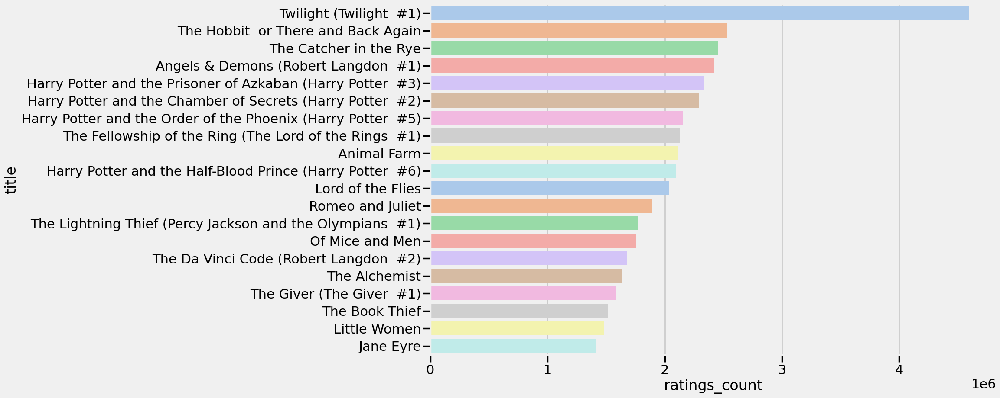

In [44]:
# Top 20 highest rated books; The Harry Potter series are dominating the ratings here
most_rated = df.sort_values('ratings_count', ascending = False).head(20).set_index('title')
plt.figure(figsize=(15,10))
sns.barplot(most_rated['ratings_count'], most_rated.index, palette='pastel')
# again we can see that Twilight has far more ratings than it's neighbours

In [45]:
# most popular in terms of average rating
df.sort_values(by = 'average_rating', ascending= False)
#The table below shows that you don't need to receive a large volume of ratings to acheive a high average rating. One rating at
# 5.0 will give you an average of 5.0, so how much weight can we give an average rating when choosing a book?

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher,Unnamed: 12,year,month,month_name
855,2843,Literature Circle Guide: Bridge to Terabithia:...,Tara MacCarthy,5.0,439271711,9780439271714,1,32,4,1,2002-01-01,Teaching Resources,NaN,2002,1,January
5650,20957,Colossians and Philemon: A Critical and Exeget...,R. McL. Wilson,5.0,567044718,9780567044716,1,512,1,0,2005-12-07,T&T Clark Int'l,NaN,2005,12,December
9897,39829,His Princess Devotional: A Royal Encounter Wit...,Sheri Rose Shepherd,5.0,1590529626,9781590529621,1,240,2,0,2007-10-16,Multnomah,NaN,2007,10,October
5025,18184,The Complete Theory Fun Factory: Music Theory ...,Ian Martin/Katie Elliott,5.0,851621813,9780851621814,1,96,1,0,2004-06-01,Boosey & Hawkes Inc,NaN,2004,6,June
4126,14741,Zone of the Enders: The 2nd Runner Official St...,Tim Bogenn,5.0,744002354,9780744002355,1,128,2,0,2003-03-06,BradyGames,NaN,2003,3,March
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6561,24749,American Writers Supplement VIII,Jay Parini/August Wilson,0.0,684806371,9780684806372,1,400,0,0,2001-05-01,Gale Cengage,NaN,2001,5,May
7402,28467,Sclerotherapy and vein treatment,Robert A. Weiss/Margaret A. Weiss/Karen L. Bea...,0.0,71485422,9780071485425,1,248,0,0,2011-12-30,McGraw-Hill Professional Publishing,NaN,2011,12,December
2532,9337,How To Meditate: An Anthology Of Talks On Medi...,Frederick P. Lenz,0.0,1932206108,9781932206104,1,228,0,0,2004-01-01,Frederick P. Lenz Foundation for American Budd...,NaN,2004,1,January
4678,16806,The Man and the Author: John Milton: Twentieth...,J. Martin Evans,0.0,415940478,9780415940474,1,386,0,0,2002-11-08,Routledge,NaN,2002,11,November


In [46]:
# sort by number pages
df.sort_values(by = 'num_pages', ascending= False)

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher,Unnamed: 12,year,month,month_name
6500,24520,The Complete Aubrey/Maturin Novels (5 Volumes),Patrick O'Brian,4.70,039306011X,9780393060119,1,6576,1338,81,2004-10-17,W. W. Norton Company,NaN,2004,10,October
6805,25587,The Second World War,Winston S. Churchill/John Keegan,4.45,039541685X,9780395416853,1,4736,1493,99,1986-05-09,Mariner Books,NaN,1986,5,May
10910,44613,Remembrance of Things Past (Boxed Set),Marcel Proust/C.K. Scott Moncrieff/Frederick A...,4.34,701125594,9780701125592,1,3400,6,1,1981-03-05,Chatto & Windus,NaN,1981,3,March
6,10,Harry Potter Collection (Harry Potter #1-6),J.K. Rowling,4.73,439827604,9780439827607,1,3342,28242,808,2005-09-12,Scholastic,NaN,2005,9,September
6825,25709,Summa Theologica 5 Vols,Thomas Aquinas,4.12,870610635,9780870610639,1,3020,2734,84,1981-01-01,Christian Classics,NaN,1981,1,January
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8993,34938,First King of Shannara (Shannara Prequel),Terry Brooks,3.96,517199963,9780517199961,1,0,1,0,1996-03-19,Random House Value Publishing,NaN,1996,3,March
9549,37911,Shipwreck (Island I),Gordon Korman/Holter Graham,3.80,439023319,9780439023313,1,0,103,14,2007-02-01,Scholastic Audio Books,NaN,2007,2,February
2676,9832,Blind Willow Sleeping Woman: 24 Stories,Haruki Murakami/Ellen Archer/Patrick Lawlor,3.84,1400102952,9781400102952,1,0,28,3,2006-10-15,Tantor Media,NaN,2006,10,October
8956,34706,13th Directorate,Barry Chubin,2.62,804104557,9780804104555,1,0,8,1,1989-02-28,Ivy Books,NaN,1989,2,February


In [47]:
#sort by ave rating/ rating count to see if those with high average rating have only 1 review, or a number 
df.sort_values(['average_rating','ratings_count'],ascending=[False,False])

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher,Unnamed: 12,year,month,month_name
4790,17224,The Diamond Color Meditation: Color Pathway to...,John Diamond,5.0,1890995525,9781890995522,1,74,5,3,2006-02-01,Square One Publishers,NaN,2006,2,February
855,2843,Literature Circle Guide: Bridge to Terabithia:...,Tara MacCarthy,5.0,439271711,9780439271714,1,32,4,1,2002-01-01,Teaching Resources,NaN,2002,1,January
4935,17830,Bulgakov's the Master and Margarita: The Text ...,Elena N. Mahlow,5.0,533017424,9780533017423,1,202,4,0,1975-01-01,Vantage Press,NaN,1975,1,January
5476,19786,The Goon Show Volume 4: My Knees Have Fallen ...,NOT A BOOK,5.0,563388692,9780563388692,1,2,3,0,1996-04-01,BBC Physical Audio,NaN,1996,4,April
1243,4287,Middlesex Borough (Images of America: New Jersey),Middlesex Borough Heritage Committee,5.0,738511676,9780738511672,1,128,2,0,2003-03-17,Arcadia Publishing,NaN,2003,3,March
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9441,37467,Classroom Interactions as Cross-Cultural Encou...,Jasmine C.M. Luk/Angel M.Y. Lin,0.0,805850848,9780805850840,1,241,0,0,2006-08-05,Routledge,NaN,2006,8,August
10142,41044,Day and Night,Better Homes and Gardens,0.0,696018829,9780696018824,1,32,0,1,1989-03-01,Meredith Corporation,NaN,1989,3,March
10501,42758,The Fantastic Vampire: Studies in the Children...,James Craig Holte,0.0,313309337,9780313309335,1,176,0,0,2002-03-30,Greenwood Press,NaN,2002,3,March
10921,44705,The Leadership Challenge: Skills for Taking Ch...,Warren G. Bennis,0.0,088684049X,9780886840495,1,60,0,0,1985-12-01,AMR/Advanced Management Reports,NaN,1985,12,December


In [48]:
#sort by rating count/ ave rating to see if those with high count have high average rating
df.sort_values(['ratings_count','average_rating'],ascending=[False,False])
# It seems that the higher the ratings_count, the lower the average rating might be.

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher,Unnamed: 12,year,month,month_name
10340,41865,Twilight (Twilight #1),Stephenie Meyer,3.59,316015849,9780316015844,1,501,4597666,94265,2006-09-06,Little Brown and Company,NaN,2006,9,September
1697,5907,The Hobbit or There and Back Again,J.R.R. Tolkien,4.27,618260307,9780618260300,1,366,2530894,32871,2002-08-15,Houghton Mifflin,NaN,2002,8,August
1462,5107,The Catcher in the Rye,J.D. Salinger,3.80,316769177,9780316769174,1,277,2457092,43499,2001-01-30,Back Bay Books,NaN,2001,1,January
307,960,Angels & Demons (Robert Langdon #1),Dan Brown,3.89,1416524797,9781416524793,1,736,2418736,21303,2006-04-01,Pocket Books,NaN,2006,4,April
3,5,Harry Potter and the Prisoner of Azkaban (Harr...,J.K. Rowling/Mary GrandPré,4.56,043965548X,9780439655484,1,435,2339585,36325,2004-05-01,Scholastic Inc.,NaN,2004,5,May
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9441,37467,Classroom Interactions as Cross-Cultural Encou...,Jasmine C.M. Luk/Angel M.Y. Lin,0.00,805850848,9780805850840,1,241,0,0,2006-08-05,Routledge,NaN,2006,8,August
10142,41044,Day and Night,Better Homes and Gardens,0.00,696018829,9780696018824,1,32,0,1,1989-03-01,Meredith Corporation,NaN,1989,3,March
10501,42758,The Fantastic Vampire: Studies in the Children...,James Craig Holte,0.00,313309337,9780313309335,1,176,0,0,2002-03-30,Greenwood Press,NaN,2002,3,March
10921,44705,The Leadership Challenge: Skills for Taking Ch...,Warren G. Bennis,0.00,088684049X,9780886840495,1,60,0,0,1985-12-01,AMR/Advanced Management Reports,NaN,1985,12,December


In [49]:
#sort by text review count/ ave rating to see if those books people have bothered to review are given a higher rating
df.sort_values(['text_reviews_count','average_rating'],ascending=[False,False])
# we can see with Twilight that only 2% of those giving a rating have actually written a review of the book.

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher,Unnamed: 12,year,month,month_name
10340,41865,Twilight (Twilight #1),Stephenie Meyer,3.59,316015849,9780316015844,1,501,4597666,94265,2006-09-06,Little Brown and Company,NaN,2006,9,September
5272,19063,The Book Thief,Markus Zusak/Cao Xuân Việt Khương,4.37,375831002,9780375831003,1,552,1516367,86881,2006-03-14,Alfred A. Knopf,NaN,2006,3,March
1069,3636,The Giver (The Giver #1),Lois Lowry,4.13,385732554,9780385732550,1,208,1585589,56604,2006-01-24,Ember,NaN,2006,1,January
284,865,The Alchemist,Paulo Coelho/Alan R. Clarke/Özdemir İnce,3.86,61122416,9780061122415,1,197,1631221,55843,1993-05-01,HarperCollins,NaN,1993,5,May
10704,43641,Water for Elephants,Sara Gruen,4.09,1565125606,9781565125605,1,335,1260027,52759,2007-05-01,Algonquin Books,NaN,2007,5,May
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9335,36946,Random House Crossword Mega Omnibus Volume 1,United Feature Syndication,0.00,081292763X,9780812927634,1,336,0,0,1997-07-22,Random House Puzzles & Games,NaN,1997,7,July
9441,37467,Classroom Interactions as Cross-Cultural Encou...,Jasmine C.M. Luk/Angel M.Y. Lin,0.00,805850848,9780805850840,1,241,0,0,2006-08-05,Routledge,NaN,2006,8,August
10501,42758,The Fantastic Vampire: Studies in the Children...,James Craig Holte,0.00,313309337,9780313309335,1,176,0,0,2002-03-30,Greenwood Press,NaN,2002,3,March
10921,44705,The Leadership Challenge: Skills for Taking Ch...,Warren G. Bennis,0.00,088684049X,9780886840495,1,60,0,0,1985-12-01,AMR/Advanced Management Reports,NaN,1985,12,December


### Analyis by authors

In [60]:
# Re-split out the authors to ensure dataframe has authors split out and language as Eng.
auth_df = df.copy() #A deep copy
auth_df["authors"]= auth_df["authors"].str.split("/", n = -1, expand = False)
auth_df = auth_df.explode('authors')
auth_df.head()

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher,Unnamed: 12,year,month,month_name
0,1,Harry Potter and the Half-Blood Prince (Harry ...,J.K. Rowling,4.57,439785960,9780439785969,1,652,2095690,27591,2006-09-16,Scholastic Inc.,NaN,2006,9,September
0,1,Harry Potter and the Half-Blood Prince (Harry ...,Mary GrandPré,4.57,439785960,9780439785969,1,652,2095690,27591,2006-09-16,Scholastic Inc.,NaN,2006,9,September
1,2,Harry Potter and the Order of the Phoenix (Har...,J.K. Rowling,4.49,439358078,9780439358071,1,870,2153167,29221,2004-09-01,Scholastic Inc.,NaN,2004,9,September
1,2,Harry Potter and the Order of the Phoenix (Har...,Mary GrandPré,4.49,439358078,9780439358071,1,870,2153167,29221,2004-09-01,Scholastic Inc.,NaN,2004,9,September
2,4,Harry Potter and the Chamber of Secrets (Harry...,J.K. Rowling,4.42,439554896,9780439554893,1,352,6333,244,2003-11-01,Scholastic,NaN,2003,11,November


In [61]:
#sort by average rating and authors
auth_df.sort_values(['average_rating','authors'],ascending=[False,False])

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher,Unnamed: 12,year,month,month_name
9286,36492,Oliver Wendell Holmes in Paris: Medicine Theo...,William C. Dowling,5.0,1584655801,9781584655800,1,179,1,1,2007-02-28,University Press of New England,NaN,2007,2,February
6250,23552,The New Big Book of America,Todd Davis,5.0,762412631,9780762412631,1,56,2,1,2002-03-21,Courage Books,NaN,2002,3,March
4126,14741,Zone of the Enders: The 2nd Runner Official St...,Tim Bogenn,5.0,744002354,9780744002355,1,128,2,0,2003-03-06,BradyGames,NaN,2003,3,March
855,2843,Literature Circle Guide: Bridge to Terabithia:...,Tara MacCarthy,5.0,439271711,9780439271714,1,32,4,1,2002-01-01,Teaching Resources,NaN,2002,1,January
9897,39829,His Princess Devotional: A Royal Encounter Wit...,Sheri Rose Shepherd,5.0,1590529626,9781590529621,1,240,2,0,2007-10-16,Multnomah,NaN,2007,10,October
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6561,24749,American Writers Supplement VIII,August Wilson,0.0,684806371,9780684806372,1,400,0,0,2001-05-01,Gale Cengage,NaN,2001,5,May
11031,45259,Anthony Thwaite: In Conversation With Peter Da...,Anthony Thwaite,0.0,953284123,9780953284122,1,96,0,0,1999-12-09,Between the Lines Productions,NaN,1999,12,December
6880,25903,I'll Be Home Before Midnight and I Won't Get P...,Anthony E. Wolf,0.0,394755669,9780394755663,1,288,0,0,1988-05-12,Knopf Doubleday Publishing Group,NaN,1988,5,May
9441,37467,Classroom Interactions as Cross-Cultural Encou...,Angel M.Y. Lin,0.0,805850848,9780805850840,1,241,0,0,2006-08-05,Routledge,NaN,2006,8,August


In [62]:
#Top 20 authors
auth_df['authors'].value_counts().nlargest(20)
# we can assume that some authors have multiple publications of the same title here.

William Shakespeare    93
Stephen King           79
J.R.R. Tolkien         51
P.G. Wodehouse         47
Agatha Christie        47
Sandra Brown           44
Orson Scott Card       43
Mercedes Lackey        43
James Patterson        43
Roald Dahl             41
Fyodor Dostoyevsky     38
Margaret Weis          38
Dean Koontz            35
Jane Austen            33
Charles Dickens        33
Terry Pratchett        33
Piers Anthony          31
Neil Gaiman            31
Tom Clancy             30
Mark Twain             30
Name: authors, dtype: int64

<AxesSubplot:>

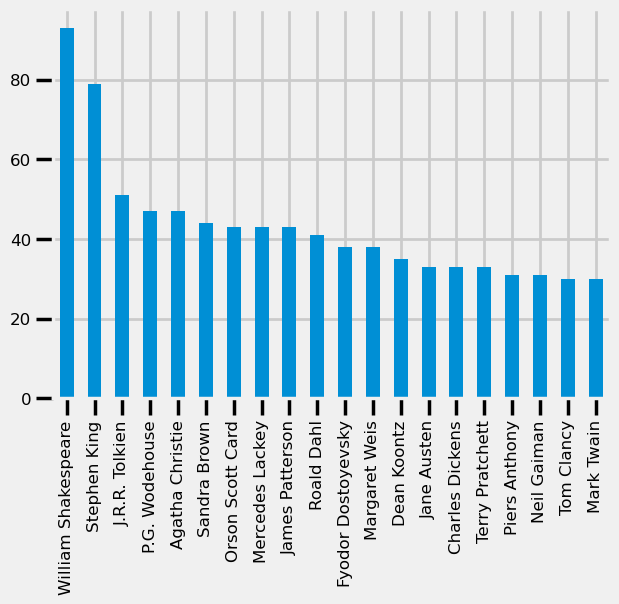

In [63]:
#Visualising the data
auth_df['authors'].value_counts().nlargest(20).plot(kind='bar', fontsize = 12)

In [229]:
#assumption above is proven as multiple publications of 'Hamlet', etc.
#chosen to keep these in though as they different versions of a book (ie, novel v's graphic novel), can recieve diff ratings
auth_df.query("authors == 'William Shakespeare'")

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher,Unnamed: 12,year,month,month_name
420,1417,The Complete Pelican Shakespeare,William Shakespeare,4.50,141000589,9780141000589,1,1808,578,25,2002-11-07,Viking,NaN,2002,11,November
421,1419,The Complete Works,William Shakespeare,4.50,517092948,9780517092941,1,1248,62,6,1991-10-13,Gramercy,NaN,1991,10,October
422,1420,Hamlet,William Shakespeare,4.02,521618746,9780521618748,1,289,609271,7139,2005-08-01,Cambridge University Press,NaN,2005,8,August
431,1433,Hamlet,William Shakespeare,4.02,140714545,9780140714548,1,148,1658,125,2001-12-01,Penguin Books,NaN,2001,12,December
433,1438,Shakespeare's Hamlet,William Shakespeare,4.02,764585681,9780764585685,1,240,102,16,2000-05-29,Cliffs Notes,NaN,2000,5,May
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10469,42607,As You Like It,William Shakespeare,3.83,074348486X,9780743484862,1,263,62368,1291,2011-08-23,Simon Schuster,NaN,2011,8,August
10470,42609,As You Like It,William Shakespeare,3.83,1904271227,9781904271222,1,449,410,36,2006-07-25,Bloomsbury Arden Shakespeare,NaN,2006,7,July
10471,42612,As You Like It (No Fear Shakespeare),William Shakespeare,3.83,1411401042,9781411401044,1,256,265,36,2004-06-22,SparkNotes,NaN,2004,6,June
10593,43180,Henry V,William Shakespeare,3.88,140714588,9780140714586,1,121,433,39,1999-09-01,Penguin Classics,NaN,1999,9,September


In [65]:
#looking at the bottom end of the scale - the 20 authors with lowest count of books
auth_df['authors'].value_counts().nsmallest(20)

Newt Scamander             1
Michael Hunter             1
Linda Cloverdale           1
Mary L. Kirchoff           1
Neal Barrett Jr.           1
Roberta Grobel Intrater    1
Claudia Carroll            1
Martha Banta               1
Sean Smith                 1
Lori Fulton                1
A.M. Homes                 1
Robert Boyle               1
Norah Vincent              1
Diana Kendall              1
Judith Cornell             1
Terri Apter                1
Jean Stone                 1
Basil Mahon                1
Christopher Wynne          1
Hervé Guibert              1
Name: authors, dtype: int64

In [66]:
auth_df['authors'].value_counts().describe()
#There are 8946 different authors in the list, the most books per author is 93 and the average number of books per author is 2

count    8946.000000
mean        2.041471
std         3.328580
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max        93.000000
Name: authors, dtype: float64

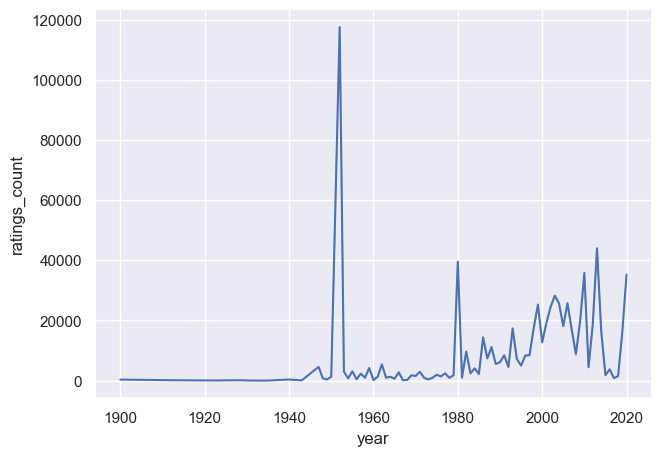

In [67]:
#Ratings_count per year
sns.set(font_scale=1)
sns.lineplot(data = df, x = 'year', y = 'ratings_count', markers = 'o', ci = False);
# Very few books published prior to the 1980's have been rated. 

In [68]:
df.groupby('year')['ratings_count'].mean().round(2)
#what book was published in 1952? - A streetcar named Desire

year
1900      332.00
1913      111.00
1923       35.00
1925       84.00
1928      110.00
          ...   
2016     3740.20
2017      805.57
2018     1507.00
2019    16120.67
2020    35275.00
Name: ratings_count, Length: 83, dtype: float64

In [69]:
#what book was published in 1952 to amount so many ratings? - A streetcar named Desire
df.query('year == 1952')
#a huge outlier so let's remove row 3346

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher,Unnamed: 12,year,month,month_name
3346,12220,A Streetcar Named Desire,Tennessee Williams,3.98,822210894,9780822210894,1,107,235224,2409,1952-12-01,Dramatists Play Service,NaN,1952,12,December
10330,41824,The Currents of Space (Galactic Empire #2),Isaac Asimov,3.83,4490249512,9780449015414,1,192,37,3,1952-01-01,Fawcett crest,NaN,1952,1,January


In [70]:
#a huge outlier so let's remove row 3346
bookID = [12220]
df = df[~df['bookID'].isin(bookID)]
df.query('year == 1952')

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher,Unnamed: 12,year,month,month_name
10330,41824,The Currents of Space (Galactic Empire #2),Isaac Asimov,3.83,4490249512,9780449015414,1,192,37,3,1952-01-01,Fawcett crest,NaN,1952,1,January


In [71]:
year_avg = df[['average_rating', 'num_pages', 'ratings_count', 'text_reviews_count', 'year']].groupby('year').mean().sort_values(by='year').reset_index()

year_avg.head(100)
# below clearly shoes that the more modern reads receive far more ratings than the classics, however, they don't necessarily 
# acheive a higher average rating.

,year,average_rating,num_pages,ratings_count,text_reviews_count
0,1900,3.880000,144.000000,332.000000,33.000000
1,1913,3.960000,448.000000,111.000000,11.000000
2,1923,4.290000,480.000000,35.000000,0.000000
3,1925,3.955000,379.000000,84.000000,4.500000
4,1928,4.340000,576.000000,110.000000,7.000000
...,...,...,...,...,...
78,2016,3.848000,225.200000,3740.200000,267.200000
79,2017,3.867143,344.571429,805.571429,24.000000
80,2018,4.103333,225.000000,1507.000000,109.333333
81,2019,3.918333,224.666667,16120.666667,1149.333333


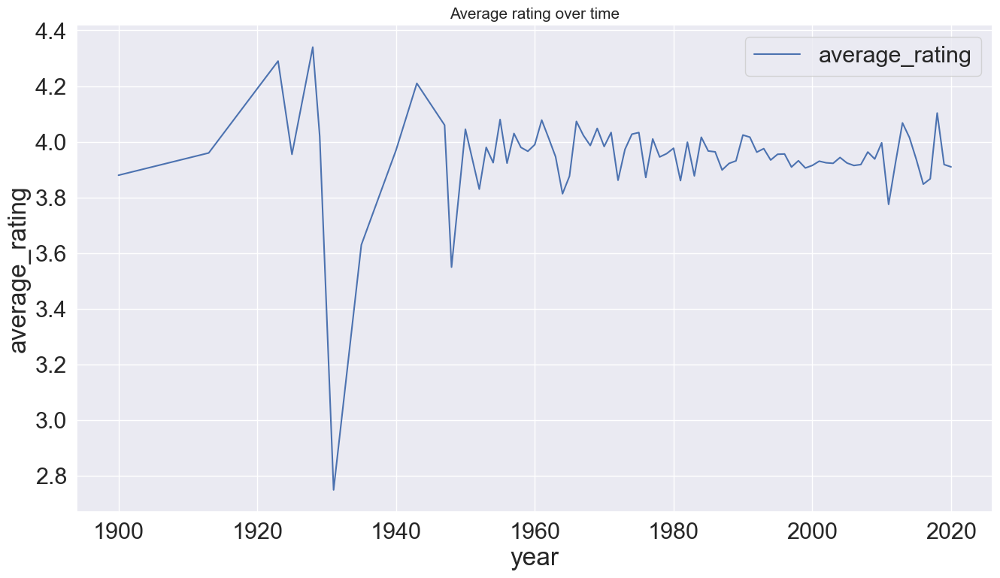

In [72]:
sns.set(font_scale=2)
plt.figure(figsize=(14,8))

plt.title("Average rating over time", fontsize=15)

lines = ['average_rating']
for line in lines:
    ax = sns.lineplot(x='year', y=line, data=year_avg)
    plt.legend(lines)

# books published during the 1930's have received far fewer ratings, however, this could be due to the fact that very few books
# were published during the second world war, and soon after as it wouldn't have been a priority, and most printers would have
# been utilised for war publications.
    

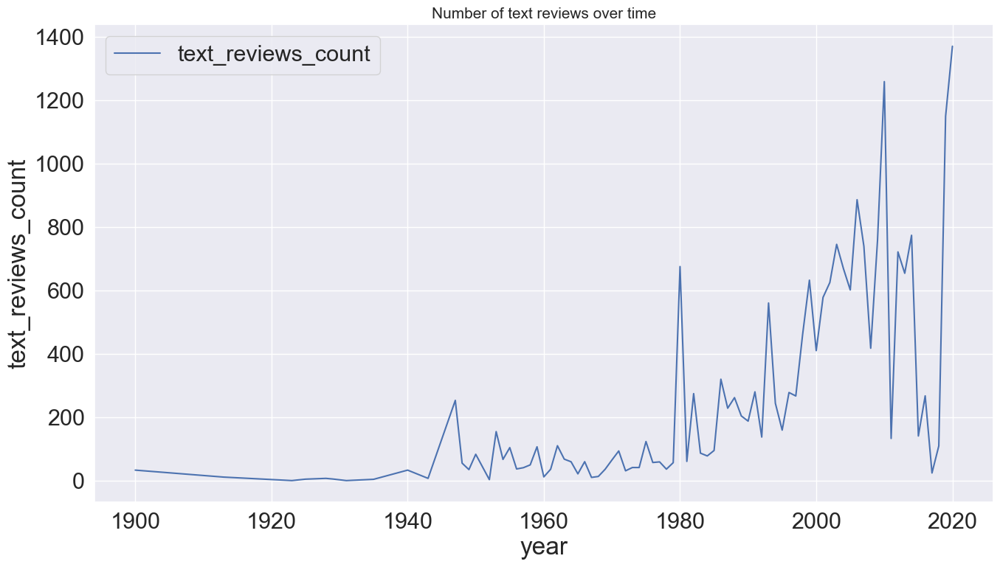

In [73]:
sns.set(font_scale=2)
plt.figure(figsize=(14,8))
plt.title("Number of text reviews over time", fontsize=15)

lines = ['text_reviews_count']
for line in lines:
    ax = sns.lineplot(x='year', y=line, data=year_avg)
    plt.legend(lines)

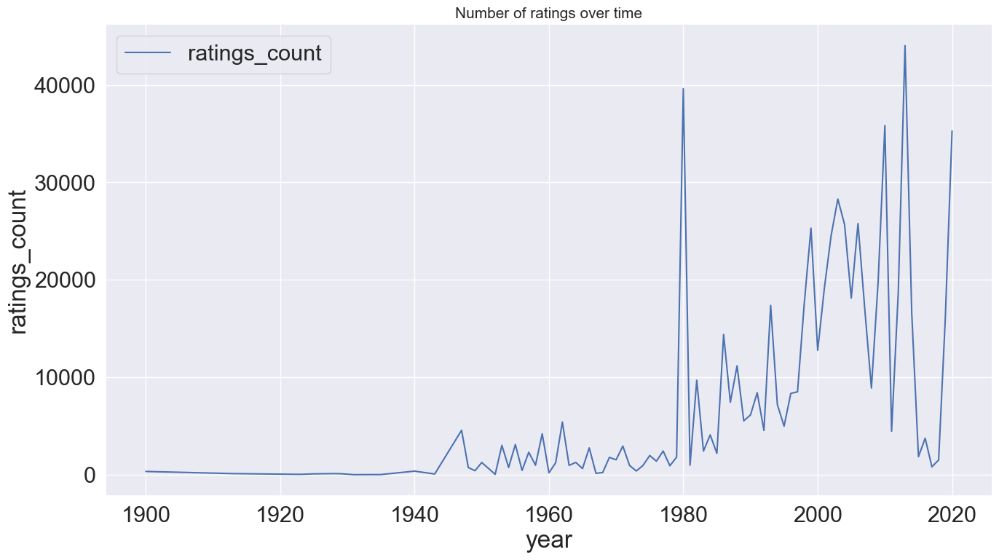

In [74]:
sns.set(font_scale=2)
plt.figure(figsize=(14,8))
plt.title("Number of ratings over time", fontsize=15)

lines = ['ratings_count']
for line in lines:
    ax = sns.lineplot(x='year', y=line, data=year_avg)
    plt.legend(lines)
    
# text review counts and number of ratings seem to correlate 

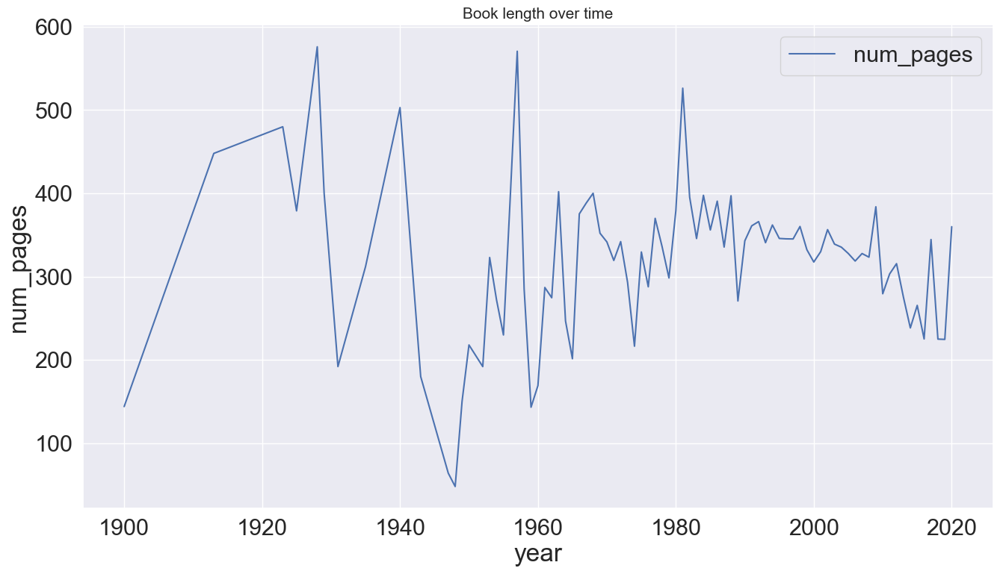

In [75]:
sns.set(font_scale=2)
plt.figure(figsize=(14,8))
plt.title("Book length over time", fontsize=15)

lines = ['num_pages']
for line in lines:
    ax = sns.lineplot(x='year', y=line, data=year_avg)
    plt.legend(lines)

# the length of a book has fluctuated widely over time, with the largest tomes being almost 600 pages, and the smallest around
# just 50 pages long.  More recently books seem to contain between 200 and 400 pages.

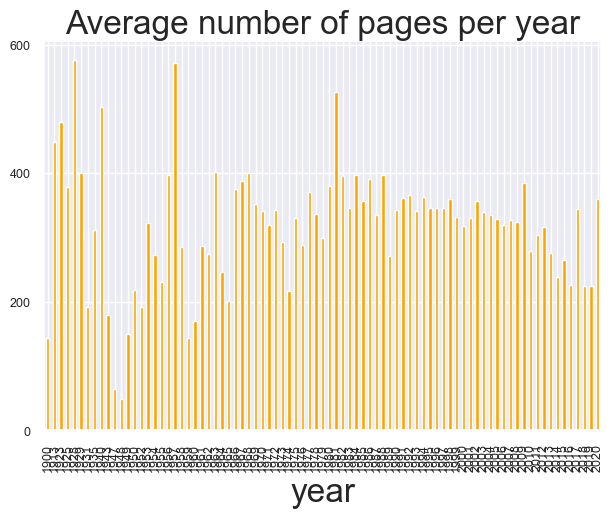

<Figure size 1000x2000 with 0 Axes>

In [76]:
#Visualised
graph = df.groupby('year')['num_pages'].mean().round(2)
bargraph = graph. plot. bar(x = 'year', y = 'num_pages', 
                         fontsize='9', title='Average number of pages per year', legend = False, color = 'orange') 
plt.figure(figsize=(10, 20));

#difficult to see the actual years relating to but definitely a dip arount the 1940's - the war years, little published?

### Average rating is greater than 4.0

In [77]:
# Look at the most highly rated books: Create new dataset where average rating is greater than 4.0; gives 4457 titles
df[df.average_rating >4]
rate_df = df[df.average_rating > 4]
#rate_df.head()

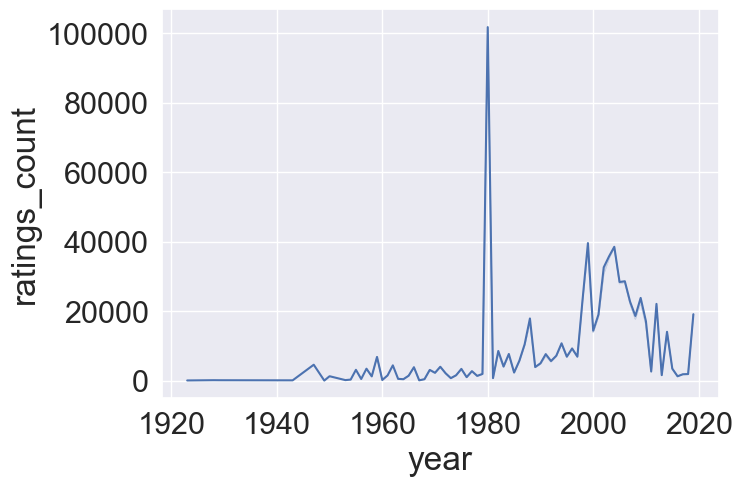

In [78]:
sns.set(font_scale=2)
sns.lineplot(data = rate_df, x = 'year', y = 'ratings_count', markers = 'o', ci = False);
# a huge spike in ratings around 1980, we must have a look to see if 1 or multiple books are creating this spike

In [79]:
rate_df.groupby('year')['ratings_count'].mean().round(2)

year
1923       35.0
1928      110.0
1929       98.0
1943       70.0
1947     4560.0
         ...   
2015     3430.6
2016     1233.5
2017     1812.0
2018     1873.0
2019    19087.0
Name: ratings_count, Length: 74, dtype: float64

In [80]:
rate_df.query('year == 1980')
#Huge number of reviews for 1980 publication is Stephen King's 'The Shining'

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher,Unnamed: 12,year,month,month_name
373,1296,The Clan of the Cave Bear (Earth's Children #1),Jean M. Auel,4.05,517542021,9780517542026,1,468,495,67,1980-05-04,Crown Publishing Group,NaN,1980,5,May
2632,9646,Homage to Catalonia,George Orwell/Lionel Trilling,4.14,156421178,9780156421171,1,232,30358,1629,1980-10-22,Harcourt Inc.(Harvest Book),NaN,1980,10,October
2666,9806,Our Ancestors: The Cloven Viscount The Baron ...,Italo Calvino,4.27,330261568,9780330261562,1,393,958,57,1980-12-31,Picador,NaN,1980,12,December
3156,11588,The Shining,Stephen King,4.22,450040186,9780450040184,1,659,978535,15105,1980-07-01,New English Library (Hodder & Stoughton),NaN,1980,7,July
4177,14947,The Diary of Virginia Woolf Volume Two: 1920-...,Virginia Woolf/Anne Olivier Bell/Andrew McNeillie,4.37,156260379,9780156260374,1,384,383,11,1980-09-17,Mariner Books,NaN,1980,9,September
5660,21032,Existential Psychotherapy,Irvin D. Yalom,4.39,465021476,9780465021475,1,544,3689,103,1980-12-08,Basic Books,NaN,1980,12,December
7387,28420,The Earth,Émile Zola/Douglas Parmée,4.08,140443878,9780140443875,1,506,1113,70,1980-06-26,Penguin Classics,NaN,1980,6,June
8406,32338,Fire in the Minds of Men: Origins of the Revol...,James H. Billington,4.54,765804719,9780765804716,1,677,96,9,1980-01-01,Basic Books,NaN,1980,1,January
9480,37630,The Good Housekeeping Illustrated Cookbook,Good Housekeeping/Zoe Coulson,4.37,878510370,9780878510375,1,512,1160,35,1980-10-01,Hearst Communications,NaN,1980,10,October
9570,38069,Zora Neale Hurston: A Literary Biography,Robert E. Hemenway/Alice Walker,4.10,252008073,9780252008078,1,408,103,9,1980-09-01,University of Illinois Press,NaN,1980,9,September


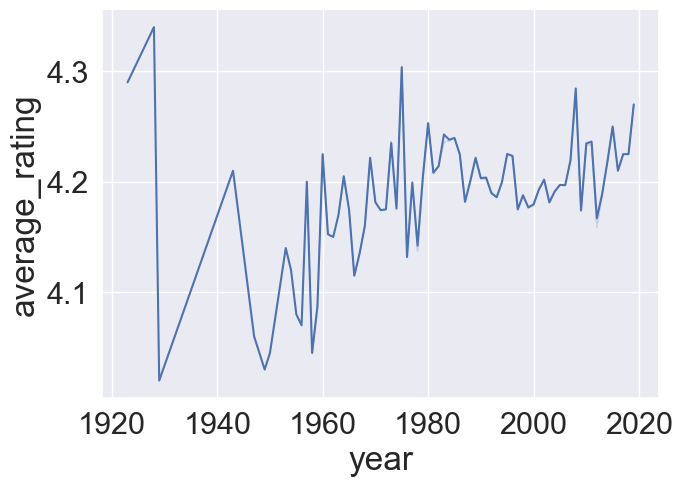

In [81]:
sns.set(font_scale=2)
sns.lineplot(data = rate_df, x = 'year', y = 'average_rating', markers = 'o', ci = False);
#we know that the books with the most ratings seem to come from those published post 1980,
#but looking at the 'average rating' there are some troughs and the odd peak but generally rating between 4.15 and 4.30

### Modern Reads

#### Looking at 'modern' reads, anything published since 1970. This will be more up-to-date to form the basis of the recommender

In [82]:
#create new dataframe with books published after 1970; authors not split out
mod_df = df[df['year']>1970]

#mod_df.head()
mod_df.shape

#leaves us with 10408 rows

(10408, 16)

In [83]:
#create new dataframe with books published after 1970; authors split out
mod_auth_df = auth_df[auth_df['year']>1970]

mod_auth_df.shape

#leaves us with 17985 rows, but many of these are multiple rows of same book due to splitting authors out

(17985, 16)

In [84]:
#create new dataframe with books published after 1970; and an average rating greater than 4.0
mod_rate_df = rate_df[rate_df['year']>1970]

mod_rate_df.shape

#leaves us with 4395 rows

(4395, 16)

In [85]:
#create new dataframe with books published after 1970, ave rating greater than 4.0 and authors split out
auth_df[auth_df.average_rating >4]
mod_rate_auth_df = auth_df[auth_df.average_rating > 4]
mod_rate_auth_df.shape
#mod_rate_auth_df.head()

#leaves us with 7928 rows

(7928, 16)

In [298]:
#mod_rate_df.info()

#### Focus on those reads post 1970 with a rating greater than 4.0

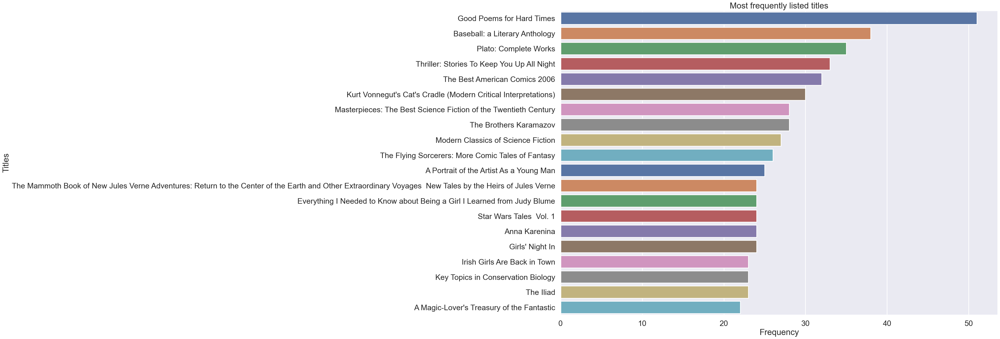

In [86]:
#show the frequently listed titles in the 'modern' dataset.  
sns.set(font_scale=3)
sns.set_context('poster')
plt.figure(figsize=(20,15))
books = mod_auth_df['title'].value_counts()[:20]
rating = mod_auth_df.average_rating[:20]
sns.barplot(x = books, y = books.index, palette='deep')
plt.title("Most frequently listed titles")
plt.xlabel("Frequency")
plt.ylabel("Titles")
plt.show()

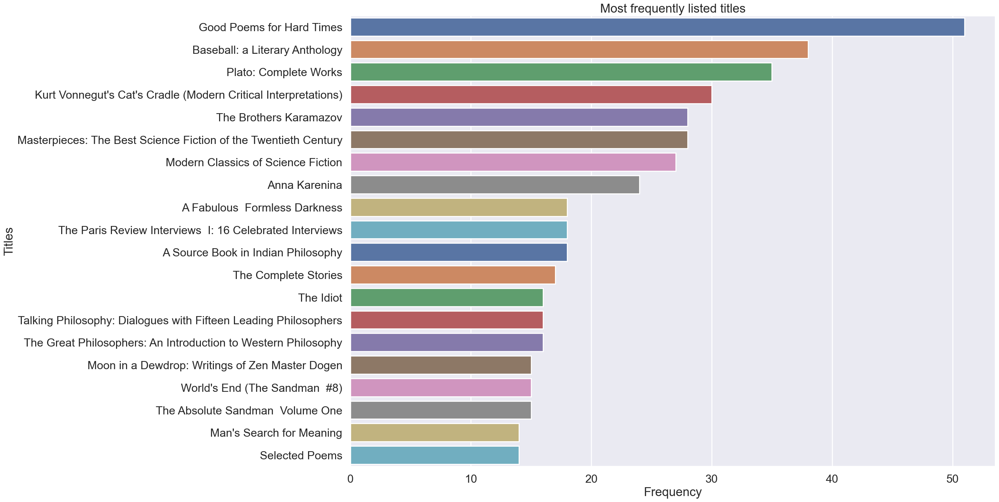

In [87]:
#show the frequently listed titles in the 'modern' dataset with an average rating >4.0  
sns.set_context('poster')
plt.figure(figsize=(20,15))
books = mod_rate_auth_df['title'].value_counts()[:20]
rating = mod_rate_auth_df.average_rating[:20]
sns.barplot(x = books, y = books.index, palette='deep')
plt.title("Most frequently listed titles")
plt.xlabel("Frequency")
plt.ylabel("Titles")
plt.show()

#By narrowing down the dataset, the most frequently listed titles have changed ever so slightly

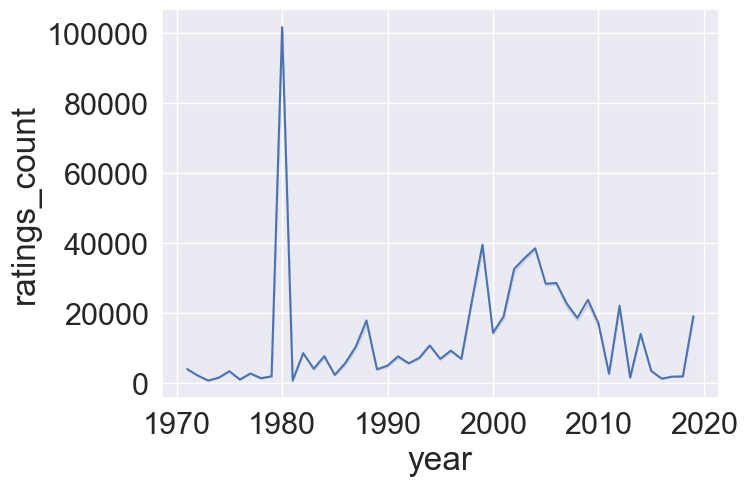

In [88]:
# modern reads by ratings count and year
sns.set(font_scale=2)
sns.lineplot(data = mod_rate_df, x = 'year', y = 'ratings_count', markers = 'o', ci = False);
#still a definite peak around 1980 with the publication of Stephen King's 'The Shining'

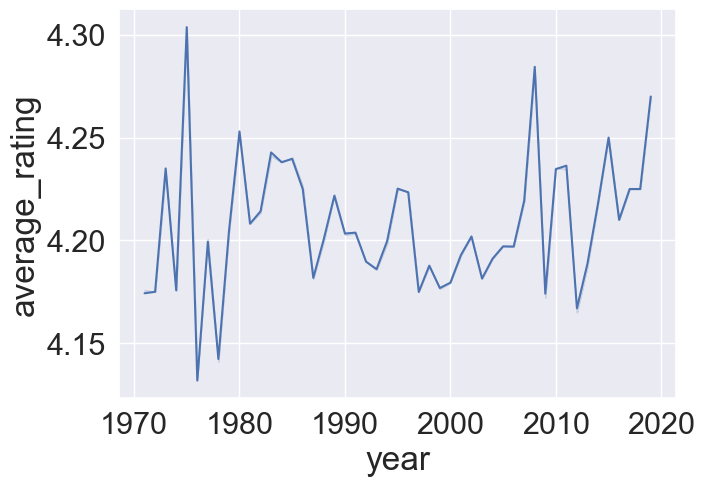

In [89]:
# modern reads by average rating  and year
sns.set(font_scale=2)
sns.lineplot(data = mod_rate_df, x = 'year', y = 'average_rating', markers = 'o', ci = False);

#Average rating is a much more volatile pattern

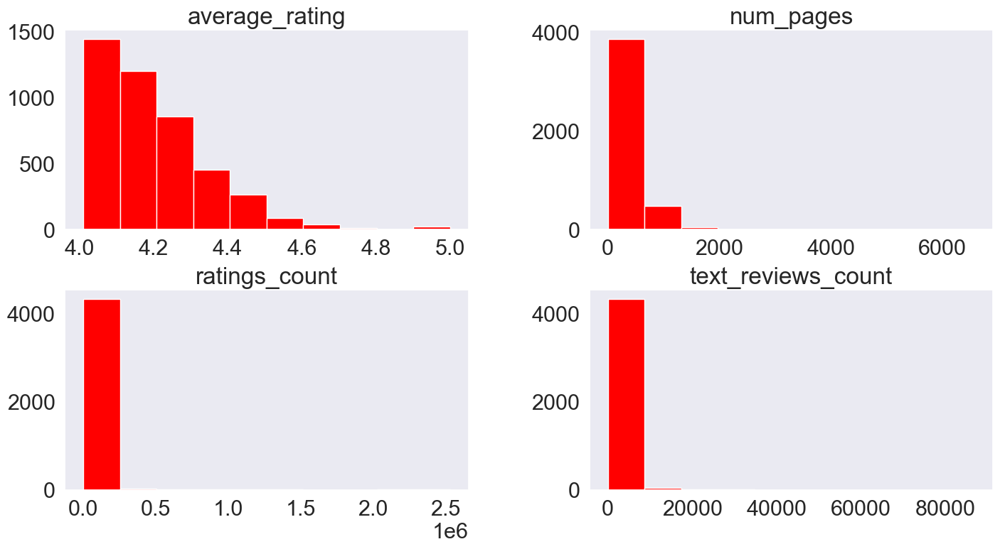

In [90]:
key_columns = ['average_rating', 'num_pages', 'ratings_count', 'text_reviews_count']
mod_rate_df[key_columns].hist(grid = False, color = 'red', figsize = (15,8));

#to compare to full dataset previously: little change in skew, but can now see the breakdown in more detail

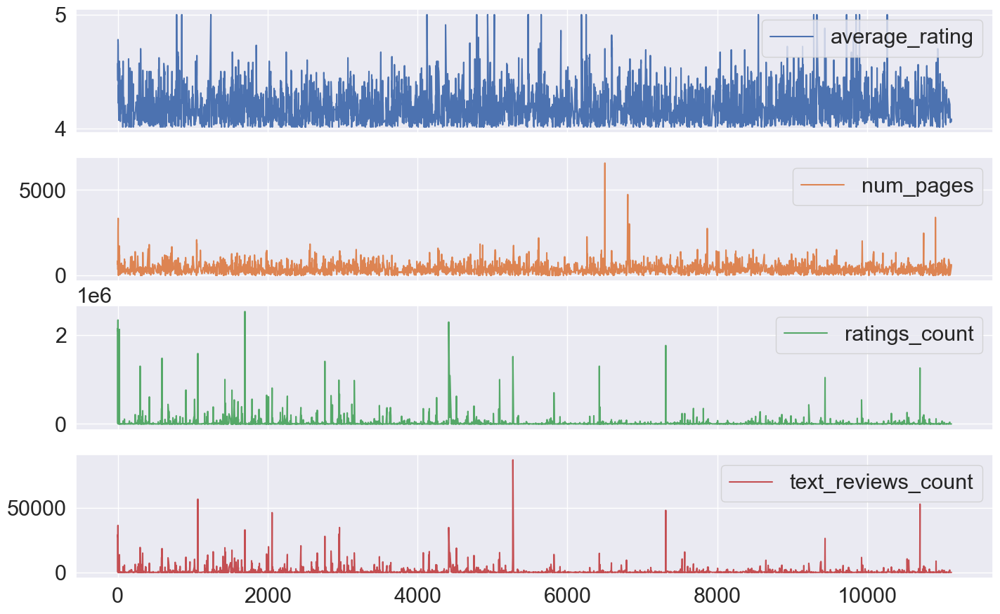

In [92]:
mod_rate_df[key_columns].plot(kind = 'line', subplots = True, figsize = (15,10));
# analyse the peaks...ie, around line ID 5500 and 10500

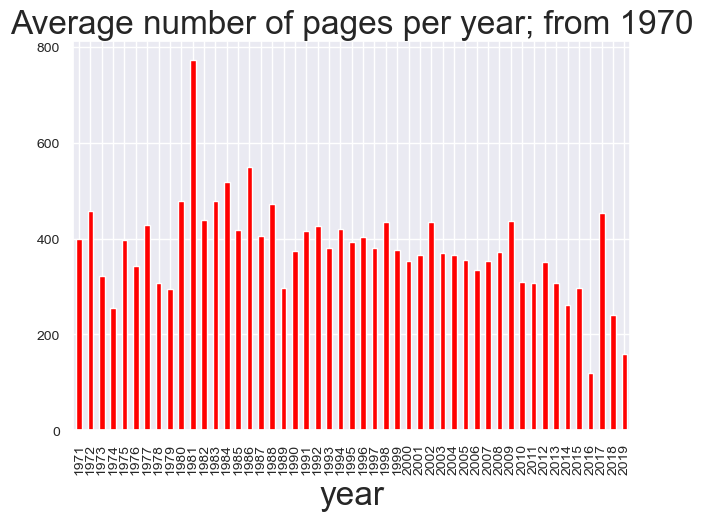

In [93]:
#Visualised
graph = mod_rate_df.groupby('year')['num_pages'].mean().round(2)
bargraph = graph. plot. bar(x = 'year', y = 'num_pages', 
                         fontsize='10', title='Average number of pages per year; from 1970', legend = False, color = 'red')

#difficult to tell, but there may be a slight decrease over time in the number of pages per book for those rated >4

In [94]:
#modern reads sorted by average rating and authors
mod_rate_auth_df.sort_values(['average_rating','authors'],ascending=[False,False])

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher,Unnamed: 12,year,month,month_name
9286,36492,Oliver Wendell Holmes in Paris: Medicine Theo...,William C. Dowling,5.00,1584655801,9781584655800,1,179,1,1,2007-02-28,University Press of New England,NaN,2007,2,February
6250,23552,The New Big Book of America,Todd Davis,5.00,762412631,9780762412631,1,56,2,1,2002-03-21,Courage Books,NaN,2002,3,March
4126,14741,Zone of the Enders: The 2nd Runner Official St...,Tim Bogenn,5.00,744002354,9780744002355,1,128,2,0,2003-03-06,BradyGames,NaN,2003,3,March
855,2843,Literature Circle Guide: Bridge to Terabithia:...,Tara MacCarthy,5.00,439271711,9780439271714,1,32,4,1,2002-01-01,Teaching Resources,NaN,2002,1,January
9897,39829,His Princess Devotional: A Royal Encounter Wit...,Sheri Rose Shepherd,5.00,1590529626,9781590529621,1,240,2,0,2007-10-16,Multnomah,NaN,2007,10,October
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7773,29993,The Visible Hand: The Managerial Revolution in...,Alfred D. Chandler Jr.,4.01,674940520,9780674940529,1,624,222,26,1977-01-01,Belknap Press,NaN,1977,1,January
6214,23419,The Consolations of Philosophy,Alain de Botton,4.01,679779175,9780679779179,1,265,13499,812,2001-04-03,Vintage,NaN,2001,4,April
6217,23423,The Consolations of Philosophy,Alain de Botton,4.01,140276610,9780140276619,1,272,763,70,2001-03-01,Penguin,NaN,2001,3,March
1253,4337,The Zanzibar Chest,Aidan Hartley,4.01,1594480117,9781594480119,1,496,2218,172,2004-08-03,Riverhead Books,NaN,2004,8,August


<AxesSubplot:xlabel='ratings_count', ylabel='title'>

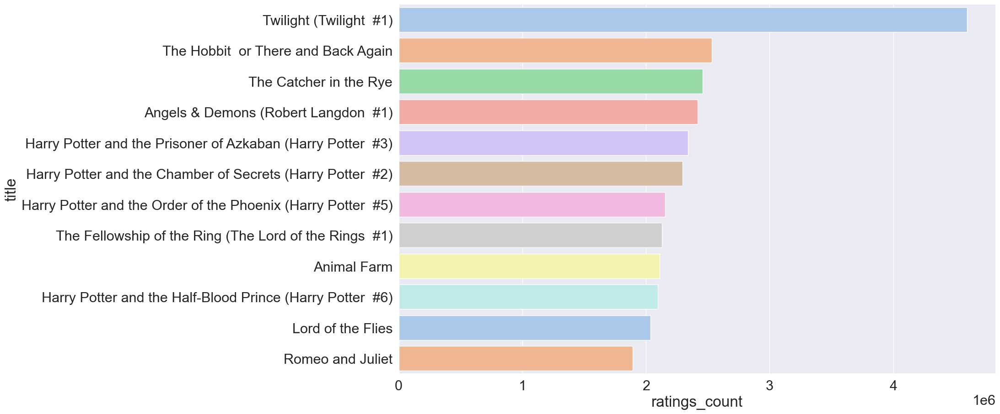

In [95]:
# Highest rated 'modern'books
most_rated = mod_auth_df.sort_values('ratings_count', ascending = False).head(20).set_index('title')
plt.figure(figsize=(15,10))
sns.barplot(most_rated['ratings_count'], most_rated.index, palette='pastel')

#Does this differ if we look at those books only rated >4?

<AxesSubplot:xlabel='ratings_count', ylabel='title'>

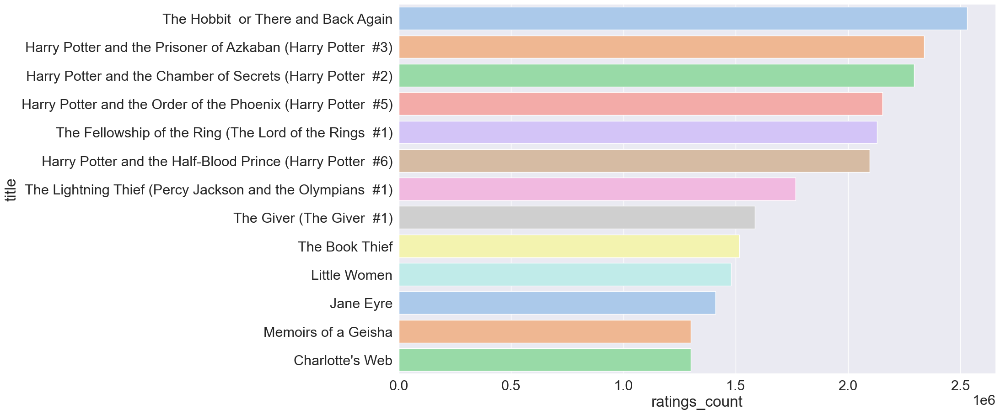

In [96]:
# Highest rated 'modern'books rated >4.0
most_rated = mod_rate_auth_df.sort_values('ratings_count', ascending = False).head(20).set_index('title')
plt.figure(figsize=(15,10))
sns.barplot(most_rated['ratings_count'], most_rated.index, palette='pastel')

# Again Harry Potter dominates but the majority have been published in the last 25 years.

In [97]:
#Top 20 modern authors rated greater than 4.0
mod_rate_auth_df['authors'].value_counts().nlargest(20)

Stephen King            41
P.G. Wodehouse          40
J.R.R. Tolkien          37
Fyodor Dostoyevsky      31
Roald Dahl              30
William Shakespeare     25
Neil Gaiman             24
C.S. Lewis              23
Jane Austen             23
Terry Pratchett         23
Leo Tolstoy             21
Rumiko Takahashi        21
Marcel Proust           19
Mercedes Lackey         19
Laura Ingalls Wilder    19
Dr. Seuss               18
Agatha Christie         17
Virginia Woolf          17
James Patterson         16
Dick Hill               16
Name: authors, dtype: int64

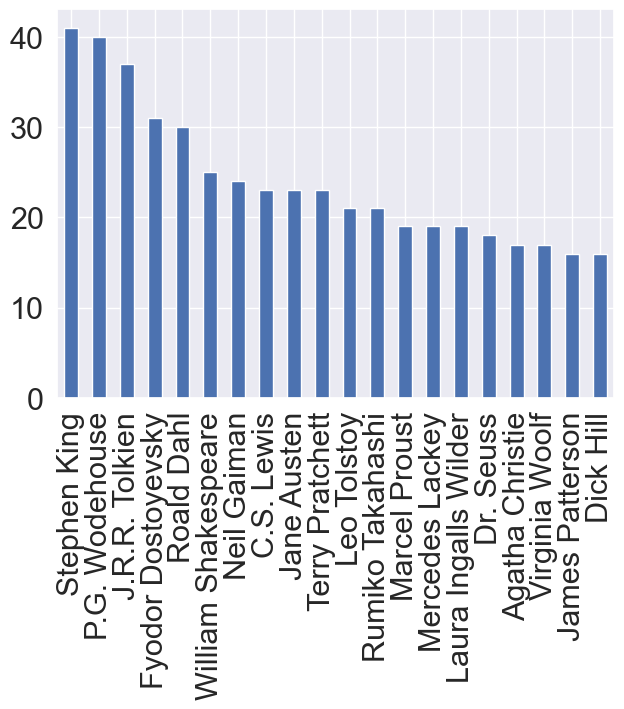

In [98]:
#Visualised
mod_rate_auth_df['authors'].value_counts().nlargest(20).plot(kind='bar');

In [99]:
#create new dataframe showing the authors, number of pages and ratings count
pages_df = mod_rate_auth_df[['authors', 'num_pages', 'ratings_count']].groupby('authors').mean().sort_values(by='ratings_count', 
                                                                                                            ascending=False)[:20]
pages_df.head(20)

#shows top 20 ranked by ratings and equivalent ave. page number per author

,num_pages,ratings_count
authors,,
Lois Lowry,208.000000,1585589.0
Cao Xuân Việt Khương,552.000000,1516367.0
Mary GrandPré,902.000000,1487330.0
Michael Mason,532.000000,1409369.0
Sara Gruen,335.000000,1260027.0
Margaret Mitchell,1037.000000,999139.0
Markus Zusak,454.500000,813632.5
Jeffrey Eugenides,272.000000,760717.0
J.K. Rowling,935.833333,749431.5


In [100]:
#create new dataframe showing the title, authors, number of pages, ratings count and month published
month_df = mod_rate_df[['title', 'authors','num_pages', 'average_rating','ratings_count', 'year', 'month_name', 'month']]
month_df.head()

,title,authors,num_pages,average_rating,ratings_count,year,month_name,month
0,Harry Potter and the Half-Blood Prince (Harry ...,J.K. Rowling/Mary GrandPré,652,4.57,2095690,2006,September,9
1,Harry Potter and the Order of the Phoenix (Har...,J.K. Rowling/Mary GrandPré,870,4.49,2153167,2004,September,9
2,Harry Potter and the Chamber of Secrets (Harry...,J.K. Rowling,352,4.42,6333,2003,November,11
3,Harry Potter and the Prisoner of Azkaban (Harr...,J.K. Rowling/Mary GrandPré,435,4.56,2339585,2004,May,5
4,Harry Potter Boxed Set Books 1-5 (Harry Potte...,J.K. Rowling/Mary GrandPré,2690,4.78,41428,2004,September,9


In [101]:
#sort data frame into descending order by ratings_count to see if any pattern in publication month, eg, summer reads
sort_month_df = month_df.sort_values(by = 'ratings_count', ascending= False)
sort_month_df.head(20)

,title,authors,num_pages,average_rating,ratings_count,year,month_name,month
1697,The Hobbit or There and Back Again,J.R.R. Tolkien,366,4.27,2530894,2002,August,8
3,Harry Potter and the Prisoner of Azkaban (Harr...,J.K. Rowling/Mary GrandPré,435,4.56,2339585,2004,May,5
4416,Harry Potter and the Chamber of Secrets (Harry...,J.K. Rowling/Mary GrandPré,341,4.42,2293963,1999,June,6
1,Harry Potter and the Order of the Phoenix (Har...,J.K. Rowling/Mary GrandPré,870,4.49,2153167,2004,September,9
23,The Fellowship of the Ring (The Lord of the Ri...,J.R.R. Tolkien,398,4.36,2128944,2003,September,9
0,Harry Potter and the Half-Blood Prince (Harry ...,J.K. Rowling/Mary GrandPré,652,4.57,2095690,2006,September,9
7312,The Lightning Thief (Percy Jackson and the Oly...,Rick Riordan,375,4.25,1766725,2006,March,3
1069,The Giver (The Giver #1),Lois Lowry,208,4.13,1585589,2006,January,1
5272,The Book Thief,Markus Zusak/Cao Xuân Việt Khương,552,4.37,1516367,2006,March,3
591,Little Women,Louisa May Alcott,449,4.07,1479727,2004,April,4


In [102]:
#new data frame containing just the top 20 from the above df
new = sort_month_df.loc[[1697,3,4416,1,23,0,7312,1069,5272,591,2764,299,6425,10704,4431,9437,1430,5095,2951,3156]]


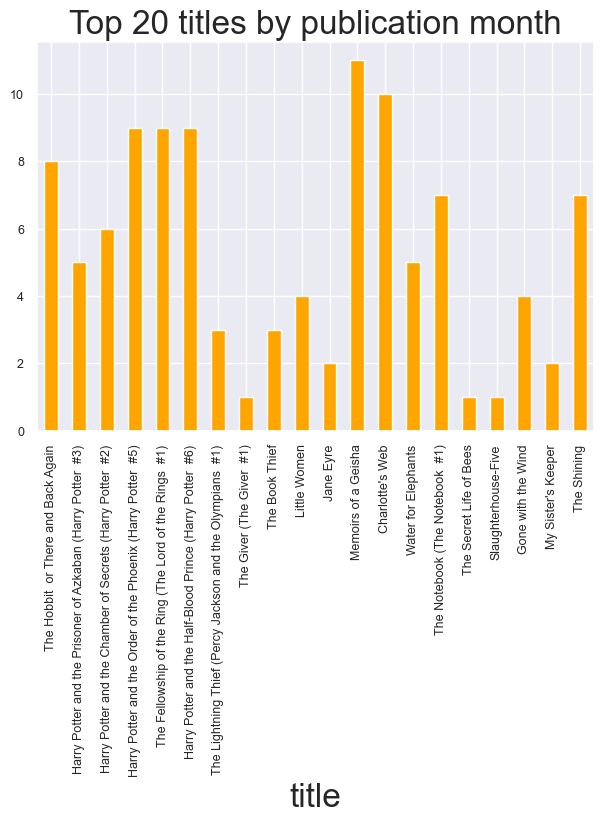

In [103]:
#Visualised
bargraph = new. plot. bar(x = 'title', y = 'month', 
                          fontsize='9', title='Top 20 titles by publication month', legend = False, color = 'orange')

In [230]:
df.groupby('month')['title'].count()

month
1      998
2      675
3      782
4      939
5      880
6      816
7      745
8      819
9     1223
10    1167
11     805
12     686
Name: title, dtype: int64

In [ ]:
# as expected, when looking at the full dataset, more books are published in the autumn, in time for Christmas sales. 

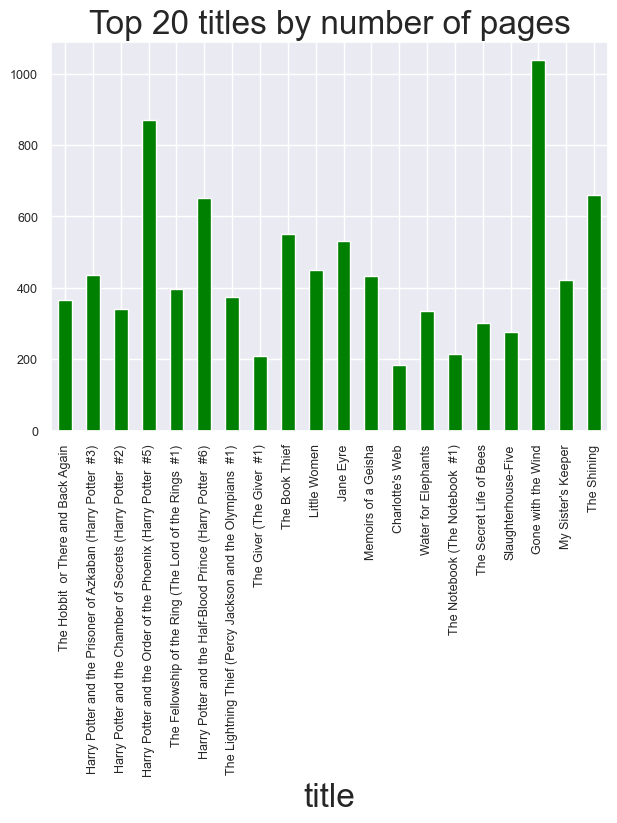

In [104]:
bargraph = new. plot. bar(x = 'title', y = 'num_pages', 
                          fontsize='9', title='Top 20 titles by number of pages', legend = False, color = 'green')

#6 out of 20 books in the top 20 have more than 500 pages.  This dataset does not differentiate betwen adult, teen and children's
#books.

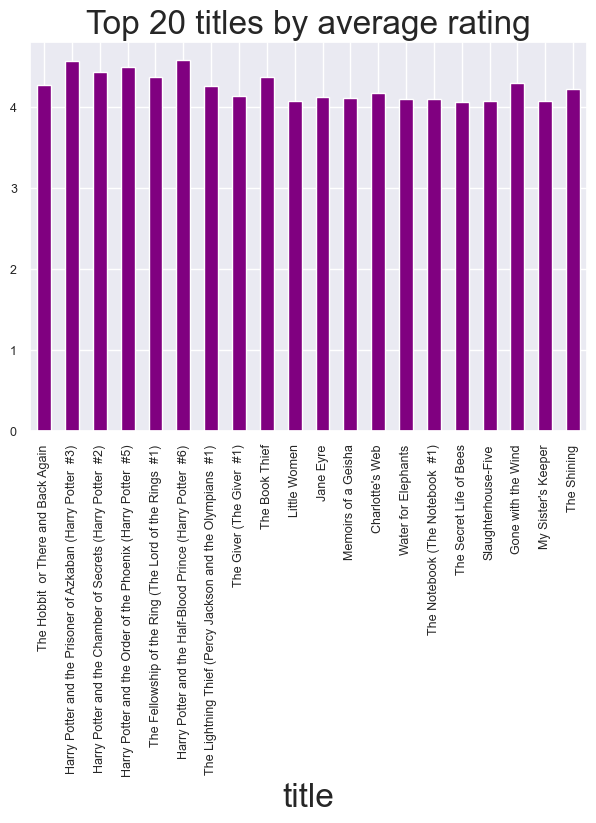

In [105]:
bargraph = new. plot. bar(x = 'title', y = 'average_rating', 
                          fontsize='9', title='Top 20 titles by average rating', legend = False, color = 'purple')

#two Harry Potter books have the highest average ratings but these top 20 titles are all quite similar ratings

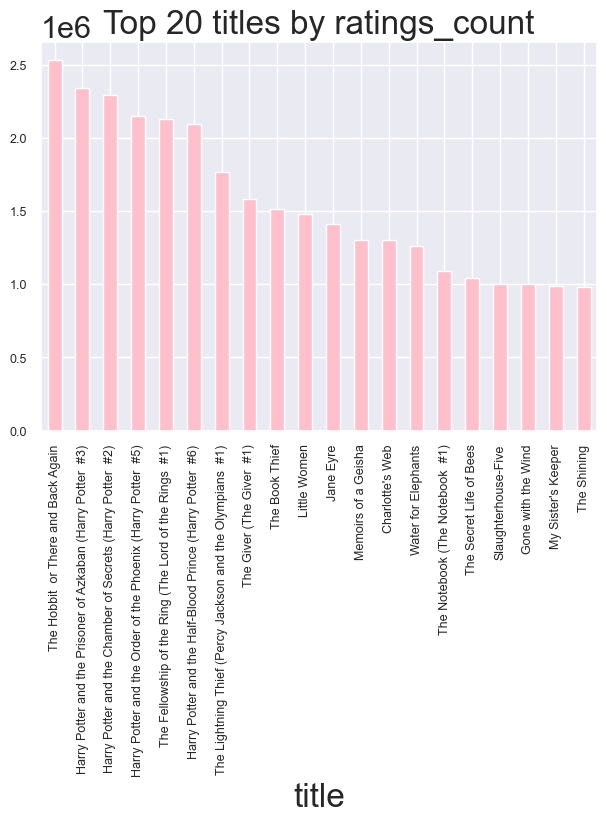

In [107]:
bargraph = new. plot. bar(x = 'title', y = 'ratings_count', 
                          fontsize='9', title='Top 20 titles by ratings_count', legend = False, color = 'pink');

# Book series dominate the ratings: Shows the same as previous graph, just in standard format with those above

### Check for outliers

#### Check for any outliers prior to Bivariate Analyis and model building to avoid skewed results

In [100]:
#mod_auth_df.sort_values(['ratings_count'],ascending=[False])
#remove bookID 41865 'Twilight #1' due to ratings_count being an outlier

In [101]:
#mod_auth_df.sort_values(['text_reviews_count'],ascending=[False])
#remove bookID 19063 'The Book Thief' due to text_reviews_count being an outlier

In [108]:
bookID = [41865, 19063]
mod_auth_df = df[~df['bookID'].isin(bookID)]

<a id="5"></a>
# <p style="padding:10px;background-color:#ffffff;margin:0;color:#78eab5;font-family:Courier New;font-size:120%;text-align:left;border-radius: 15px 50px;overflow:hidden;font-weight:1000"> Bivariate Analysis </p>

 #### with clean data, and authors split into separate rows - books post 1970

In [109]:
drop_cols = ['bookID', 'isbn', 'isbn13','language_code', 'publication_date', 'publisher', 'Unnamed: 12', 'month_name']

<AxesSubplot:>

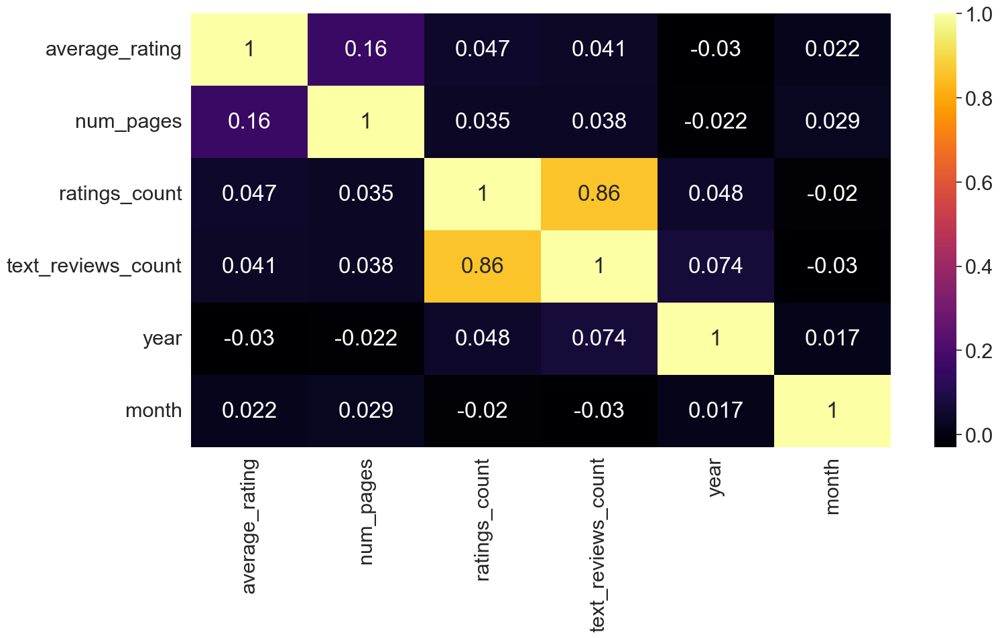

In [110]:
#full 'modern'datset
corr = mod_auth_df.drop(columns = drop_cols, axis = 1).corr().round(3)
plt.figure(figsize= (15,8))
sns.heatmap(corr, annot=True, cmap = 'inferno')

<AxesSubplot:>

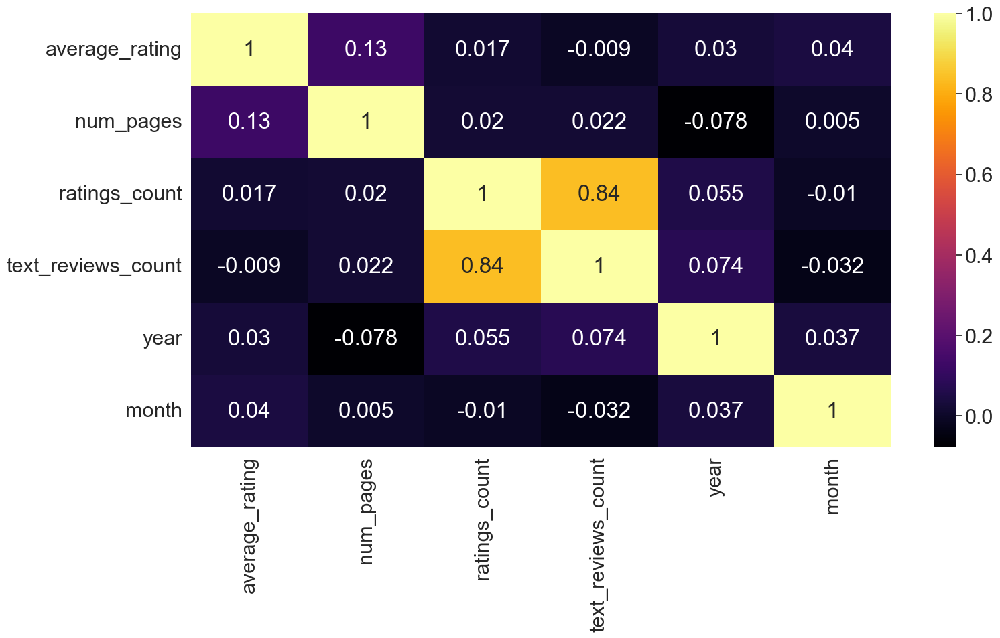

In [111]:
#compared to those books only rated 4 or above
corr = mod_rate_auth_df.drop(columns = drop_cols, axis = 1).corr().round(3)
plt.figure(figsize= (15,8))
sns.heatmap(corr, annot=True, cmap = 'inferno')

In [ ]:
#Does the finetuning/ narrowing of the dataset lead to a stronger correlation between variables.  The answer is negligible

In [112]:
#correlate on average rating
corr['average_rating'].sort_values()

text_reviews_count   -0.009
ratings_count         0.017
year                  0.030
month                 0.040
num_pages             0.127
average_rating        1.000
Name: average_rating, dtype: float64

In [113]:
#correlate on number of pages
corr['num_pages'].sort_values()

year                 -0.078
month                 0.005
ratings_count         0.020
text_reviews_count    0.022
average_rating        0.127
num_pages             1.000
Name: num_pages, dtype: float64

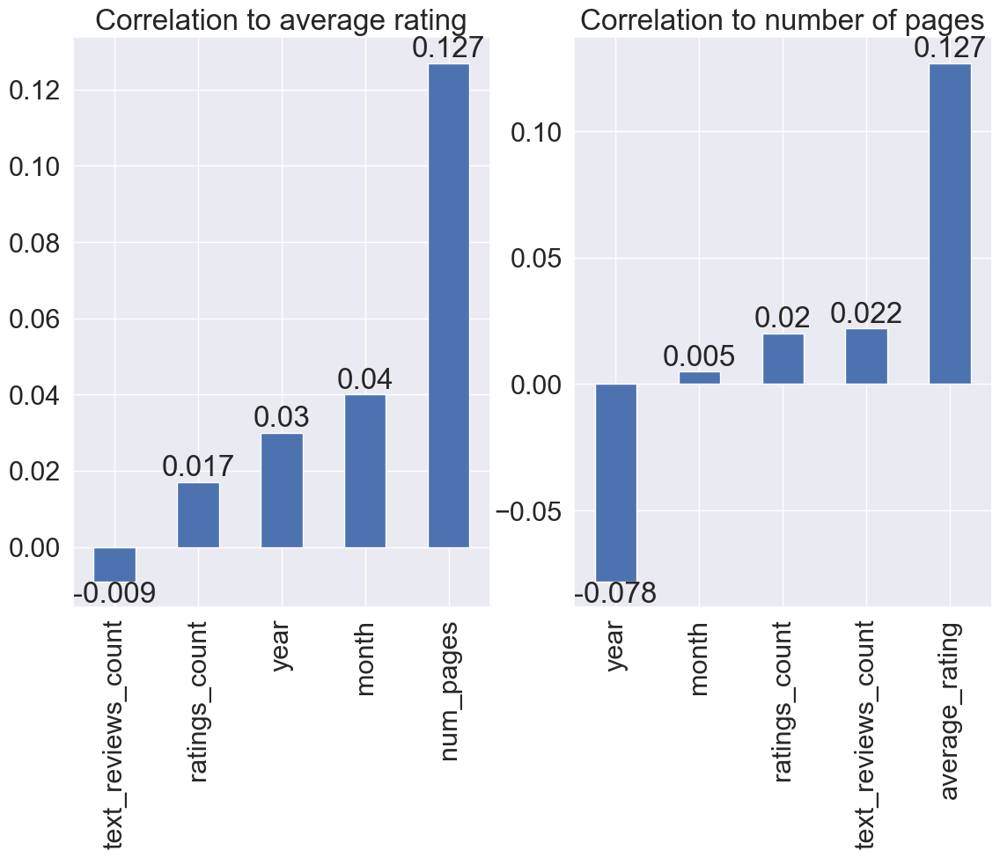

In [115]:
plt.subplot(1,2,1)
ax = corr['average_rating'].sort_values()[:-1].plot(kind = 'bar', figsize = (12,8), title = "Correlation to average rating")

ax.bar_label(ax.containers[0])

plt.subplot(1,2,2)
ax = corr['num_pages'].sort_values()[:-1].plot(kind = 'bar', figsize = (12,8), title = "Correlation to number of pages")

ax.bar_label(ax.containers[0]);

In [ ]:
#Average rating and number of pages appear to have the most correlation

In [116]:
#interactive chart.
corr['average_rating'].sort_values()[:-1].plot(kind = 'bar', backend = 'plotly')

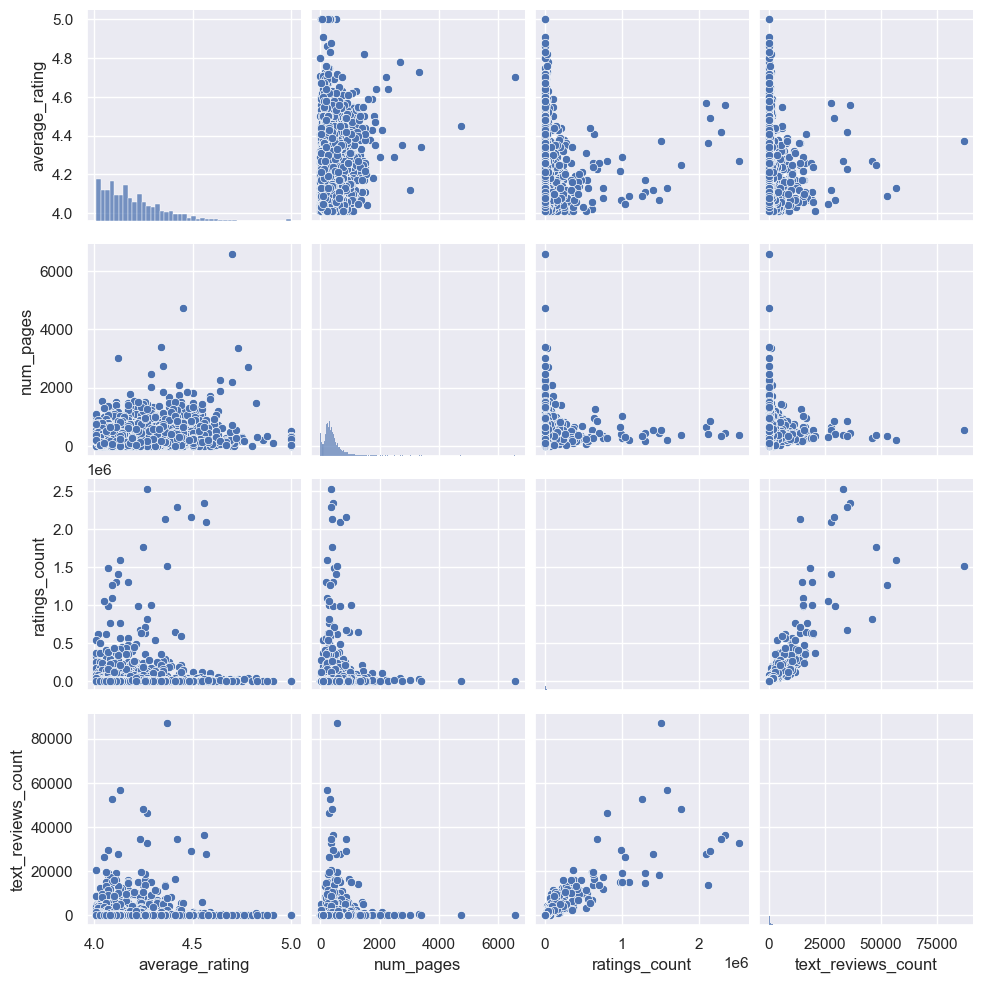

In [110]:
sns.set(font_scale=1)
sns.pairplot(mod_rate_df[key_columns])

### Are there any linear relationships between the variables?

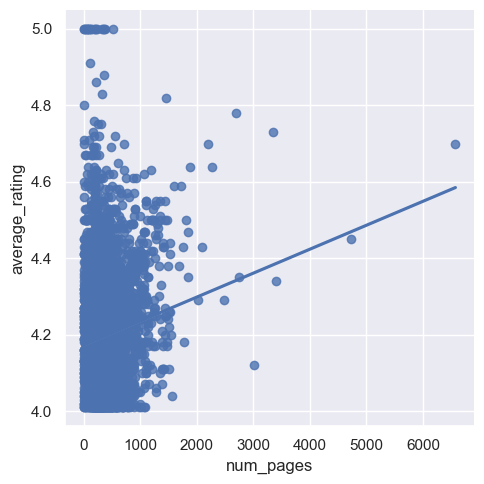

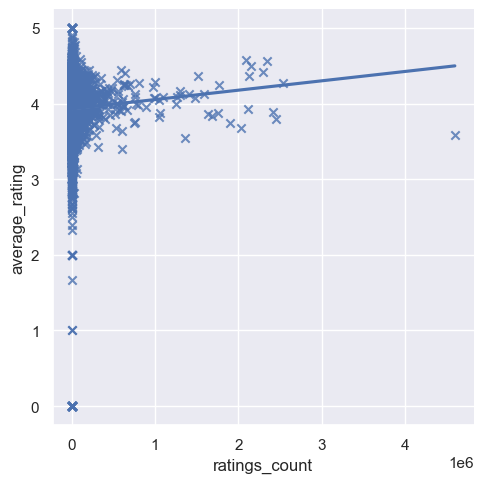

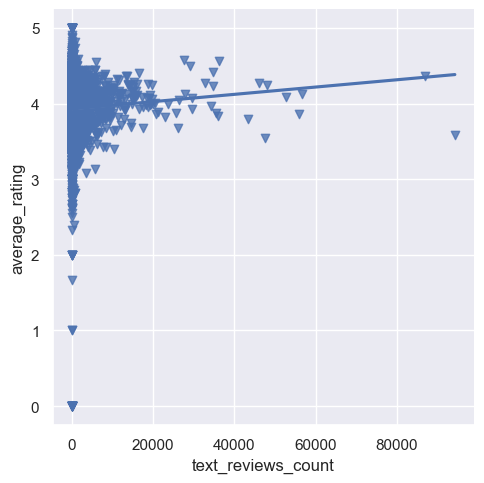

In [117]:
sns.set(font_scale=1)
sns.lmplot(x = 'num_pages', y = 'average_rating', data = mod_rate_df, ci = False, order = 1, markers = ['o']);
sns.lmplot(x = "ratings_count", y = "average_rating", data = df, ci = False, order = 1, markers = ['x']);
sns.lmplot(x = "text_reviews_count", y = "average_rating", data = df, ci = False, order = 1, markers = ['v']);

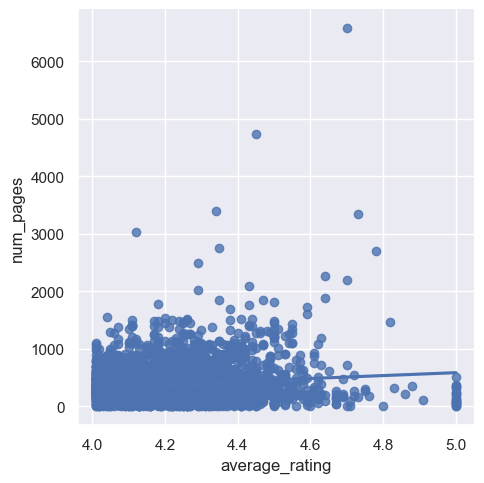

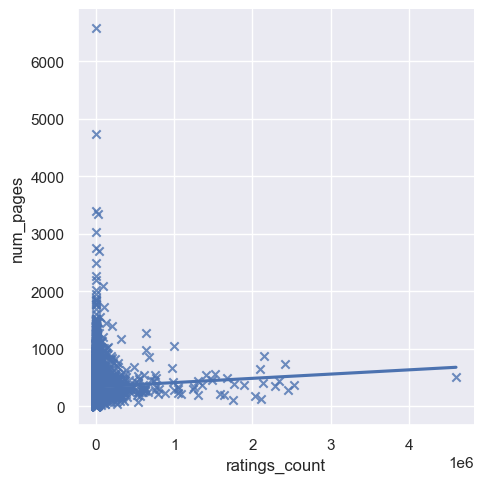

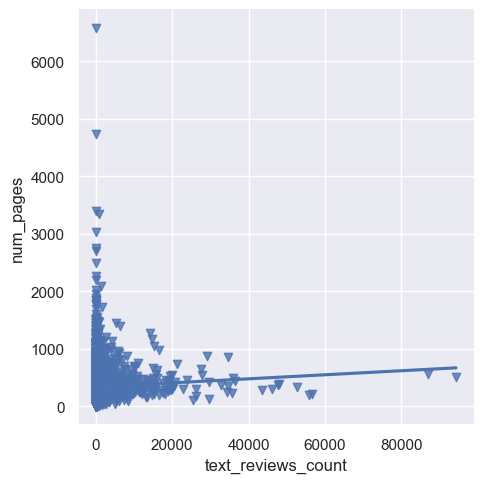

In [112]:
sns.set(font_scale=1)
sns.lmplot(x = 'average_rating', y = 'num_pages', data = mod_rate_df, ci = False, order = 1, markers = ['o']);
sns.lmplot(x = "ratings_count", y = "num_pages", data = df, ci = False, order = 1, markers = ['x']);
sns.lmplot(x = "text_reviews_count", y = "num_pages", data = df, ci = False, order = 1, markers = ['v']);

In [ ]:
#both the above sets of plots show that there is no real linear relationship betwen the variables

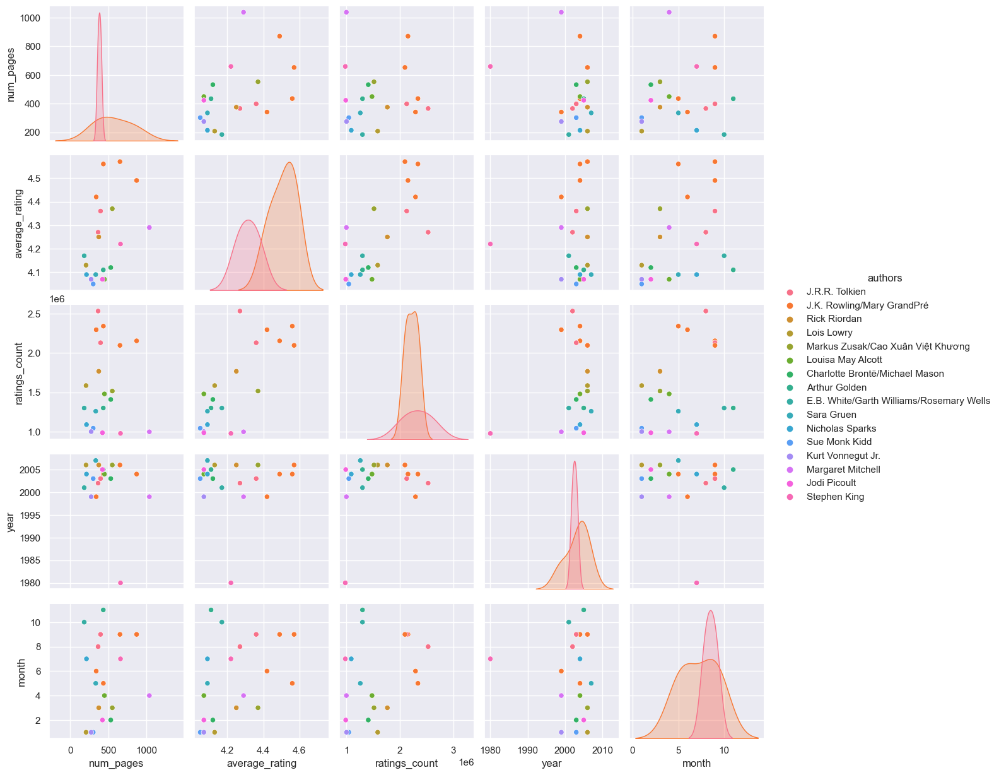

In [118]:
sns.set(font_scale=1)
sns.pairplot(data=new, hue = "authors");
# pairplot based on 'top 20 reads and their authors'
# some of the authors have multiple books in the top 20
# all but one of the books were published from 2020 onwards
# people are no more likely to rate a summer read highly as they are to highly rate a christmas read

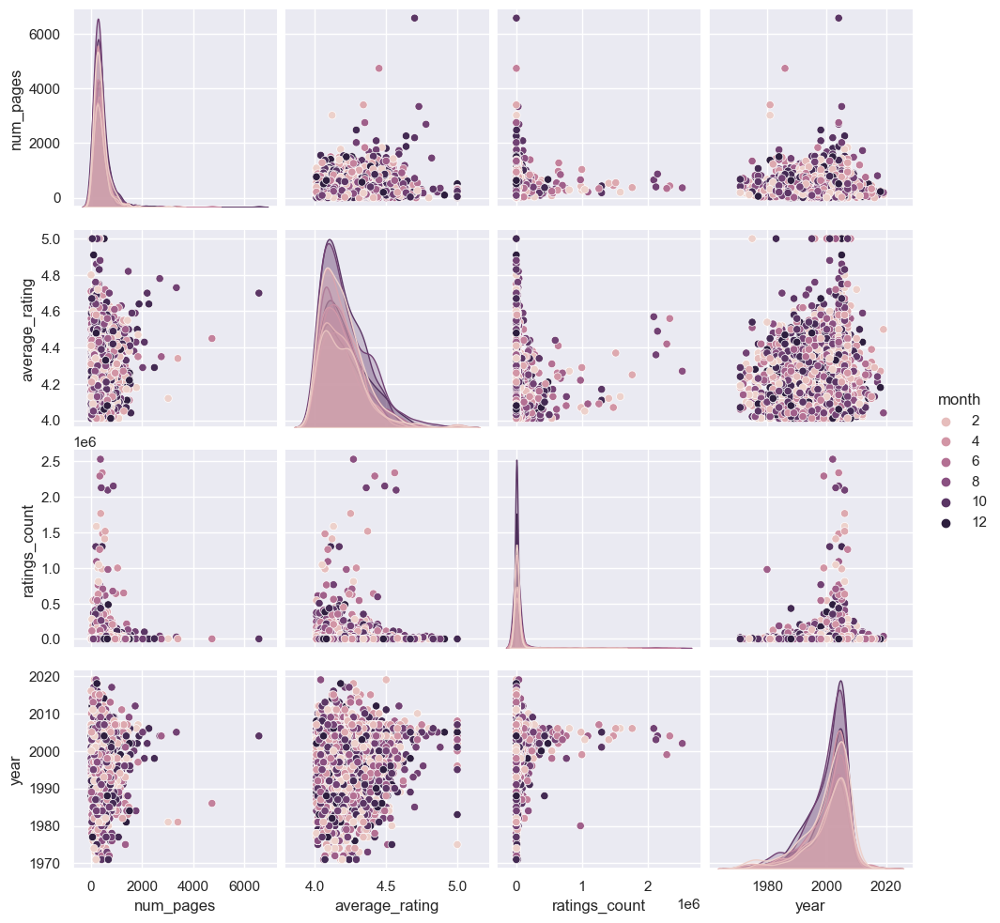

In [119]:
sns.set(font_scale=1)
sns.pairplot(data=month_df, hue = "month");

<a id="6"></a>
# <p style="padding:10px;background-color:#ffffff;margin:0;color:#78eab5;font-family:Courier New;font-size:120%;text-align:left;border-radius: 15px 50px;overflow:hidden;font-weight:1000"> Data prep for modelling </p>

In [120]:
#mod_auth_df.head()
#drop columns to create dataframe for modelling = drop_df
drop_cols = ['bookID','isbn', 'isbn13','language_code', 'publication_date', 'publisher', 'Unnamed: 12', 'month_name']
drop_df = mod_auth_df.drop(columns = drop_cols)
drop_df.head()

,title,authors,average_rating,num_pages,ratings_count,text_reviews_count,year,month
0,Harry Potter and the Half-Blood Prince (Harry ...,J.K. Rowling/Mary GrandPré,4.57,652,2095690,27591,2006,9
1,Harry Potter and the Order of the Phoenix (Har...,J.K. Rowling/Mary GrandPré,4.49,870,2153167,29221,2004,9
2,Harry Potter and the Chamber of Secrets (Harry...,J.K. Rowling,4.42,352,6333,244,2003,11
3,Harry Potter and the Prisoner of Azkaban (Harr...,J.K. Rowling/Mary GrandPré,4.56,435,2339585,36325,2004,5
4,Harry Potter Boxed Set Books 1-5 (Harry Potte...,J.K. Rowling/Mary GrandPré,4.78,2690,41428,164,2004,9


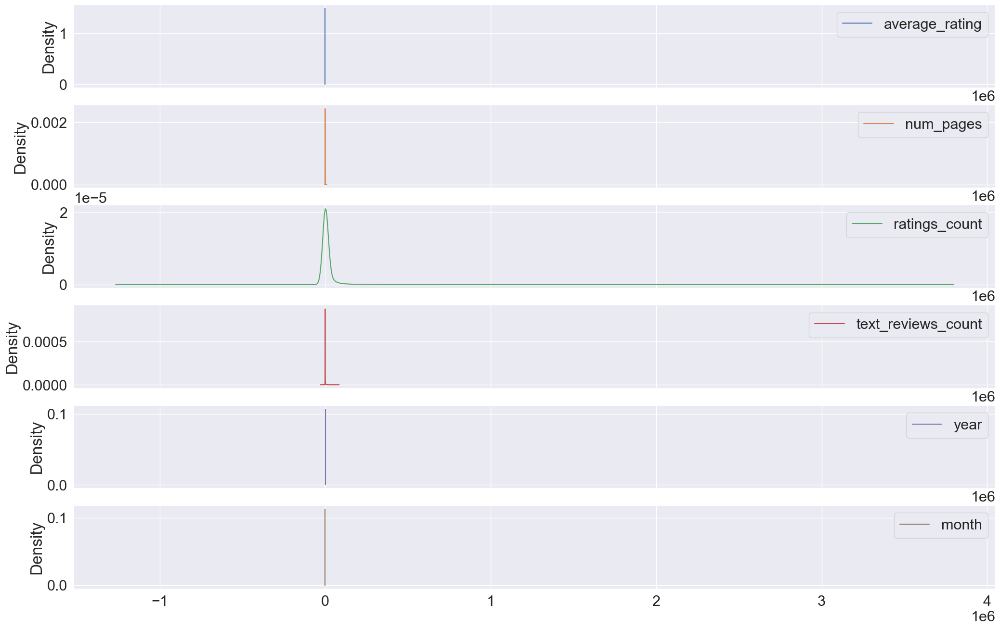

In [121]:
#from drop_df, drop non-numerical values = num_df
sns.set(font_scale=2)
num_df = drop_df.select_dtypes(['int', 'float'])
num_df.plot(kind = 'kde', subplots = True, figsize = (22,15));

### Standardising the values

**Normalization** is a statistical method that helps mathematical-based algorithms to interpret features with different magnitudes and distributions equally. We use `StandardScaler()` to normalize our dataset
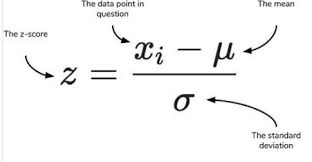

In [122]:
#Standardise and scale the numerical data prior to modelling
scaler = StandardScaler()

scaled_df = scaler.fit_transform(num_df)

type(scaled_df)

numpy.ndarray

In [123]:
#Data is in an array, put it back into a dataframe called scaled_df
scaled_df = pd.DataFrame(scaled_df, columns = num_df.columns)

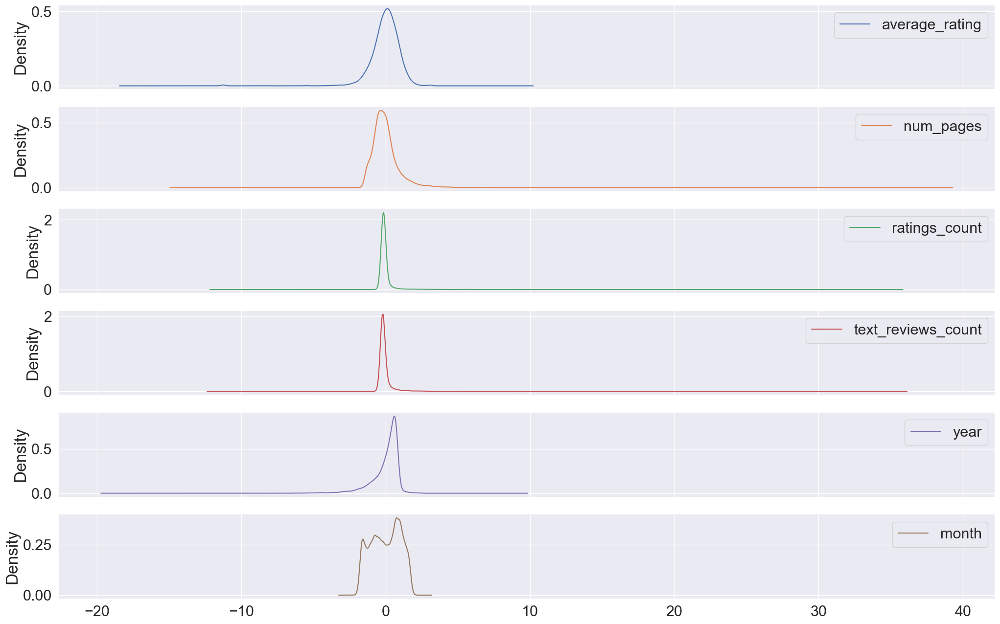

In [124]:
sns.set(font_scale=2)
scaled_df.plot(kind = 'kde', subplots = True, figsize = (22, 15));

#we can now see more of a spread in our data, be it quite small in most cases

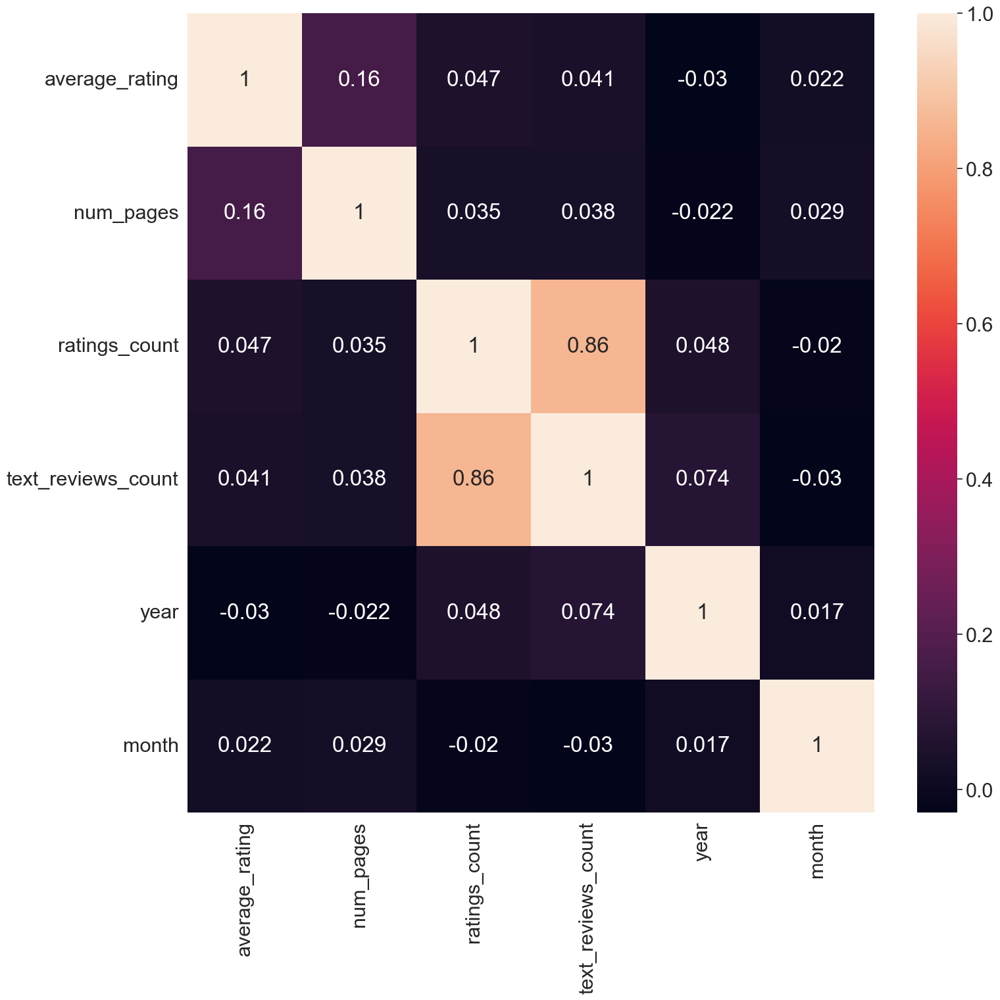

In [125]:
plt.figure(figsize = (15,15))
sns.heatmap(scaled_df.corr().round(3), annot=True);
#as expected, the correlation with the scaled data is the same as with the unscaled data
#scaling doesn't change the relationships between the variables.

#### Replace the numerical values in the original (drop_df) dataset with the standardised values

In [126]:
num_cols = scaled_df.columns.tolist()
num_cols

['average_rating',
 'num_pages',
 'ratings_count',
 'text_reviews_count',
 'year',
 'month']

In [127]:
drop_df.orig = drop_df.copy()

In [128]:
drop_df.loc[:, num_cols] = scaled_df[num_cols]

In [129]:
drop_df.head()

,title,authors,average_rating,num_pages,ratings_count,text_reviews_count,year,month
0,Harry Potter and the Half-Blood Prince (Harry ...,J.K. Rowling/Mary GrandPré,1.831269,1.305355,19.708160,11.581333,0.717773,0.710985
1,Harry Potter and the Order of the Phoenix (Har...,J.K. Rowling/Mary GrandPré,1.601901,2.204202,20.253416,12.279492,0.471517,0.710985
2,Harry Potter and the Chamber of Secrets (Harry...,J.K. Rowling,1.401203,0.068410,-0.112538,-0.131894,0.348389,1.297607
3,Harry Potter and the Prisoner of Azkaban (Harr...,J.K. Rowling/Mary GrandPré,1.802598,0.410632,22.021871,15.322267,0.471517,-0.462257
4,Harry Potter Boxed Set Books 1-5 (Harry Potte...,J.K. Rowling/Mary GrandPré,2.433362,9.708334,0.220391,-0.166160,0.471517,0.710985


<a id="7"></a>
# <p style="padding:10px;background-color:#ffffff;margin:0;color:#78eab5;font-family:Courier New;font-size:120%;text-align:left;border-radius: 15px 50px;overflow:hidden;font-weight:1000"> Model Building </p>

### Clustering using KMeans

### Optimal clusters using the 'Elbow' Method

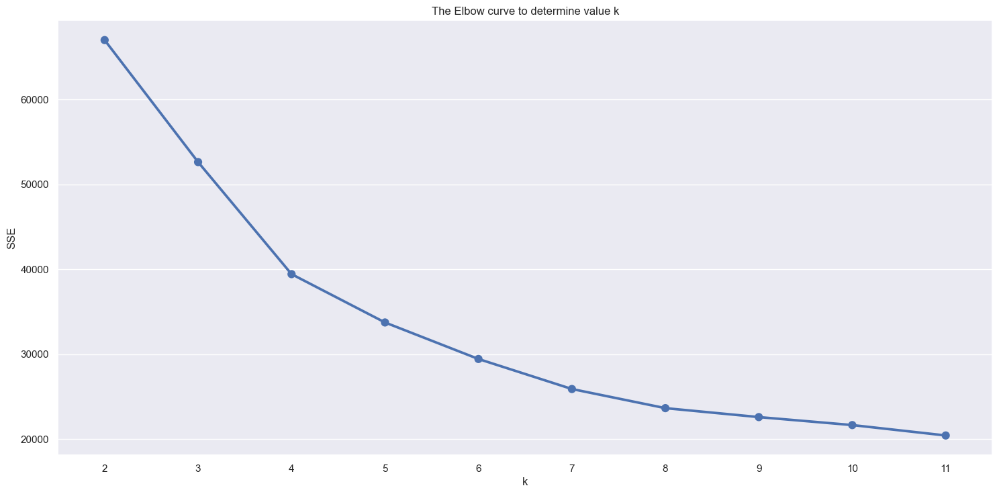

In [166]:
# focusing on numerical columns only: data set = num_df_scaled
sse = {}

for k in range(2, 12):
    kmeans = KMeans(n_clusters= k, random_state = 42)
    kmeans.fit(scaled_df)
    sse[k] = kmeans.inertia_
    
plt.figure(figsize= (16,8))
plt.title ('The Elbow curve to determine value k')
plt.xlabel ('k')
plt.ylabel ('SSE')
sns.pointplot(x=list(sse.keys()), y=list(sse.values()));

#It's a very gentle curve and diffucult to determine the optimal value of k.

In [167]:
# To help determine the optimal value, let's calculate the change in the SSE value

interia_df = pd.DataFrame(sse, index = range(0, len(sse)))
interia_df = interia_df.drop_duplicates().T
interia_df['pct_change'] = interia_df.pct_change().round(4).multiply(-100)
interia_df = interia_df.reset_index()
interia_df

,index,0,pct_change
0,2,67007.521943,NaN
1,3,52636.829393,21.45
2,4,39433.893254,25.08
3,5,33741.879342,14.43
4,6,29438.096975,12.76
5,7,25901.496291,12.01
6,8,23647.601800,8.70
7,9,22594.321870,4.45
8,10,21653.838310,4.16
9,11,20428.865061,5.66


Text(0, 0.5, 'Percentage change')

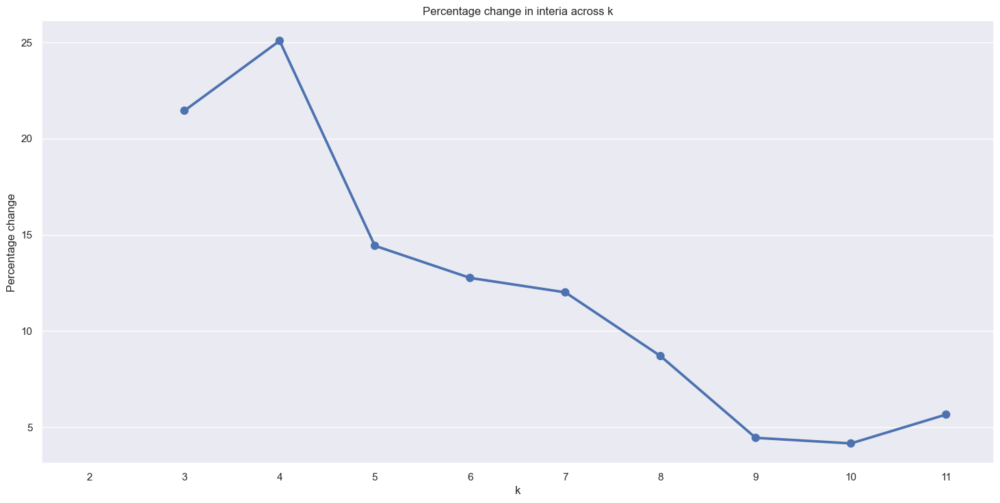

In [168]:
# Visualise the percentage change in inertia
plt.figure(figsize = (16,8))

sns.pointplot(interia_df['index'], y = interia_df['pct_change'])

plt.title('Percentage change in interia across k')
plt.xlabel('k')
plt.ylabel('Percentage change')

#looks to be 2 elbows, one at 4 and one again at 7 but little SSE change from 7 to 8 so ideal cluster is perhaps 7

In [179]:
# intiate the model with 7 clusters, then 6 then 5
kmean = KMeans(random_state=42, n_clusters = 6)

# fit the model 
kmean.fit(scaled_df)

KMeans(n_clusters=6, random_state=42)

In [180]:
print(kmean.labels_)
len(kmean.labels_)

[3 3 2 ... 5 2 1]


10533

In [181]:
#Adding the cluster number to the scaled dataframe
scaled_df['cluster'] = kmean.labels_

In [182]:
# we can now see a new column at the end with the number of the cluster given to it.
scaled_df.head()

,average_rating,num_pages,ratings_count,text_reviews_count,year,month,cluster,cluster_grp
0,1.831269,1.305355,19.708160,11.581333,0.717773,0.710985,3,3
1,1.601901,2.204202,20.253416,12.279492,0.471517,0.710985,3,3
2,1.401203,0.068410,-0.112538,-0.131894,0.348389,1.297607,2,1
3,1.802598,0.410632,22.021871,15.322267,0.471517,-0.462257,3,3
4,2.433362,9.708334,0.220391,-0.166160,0.471517,0.710985,5,0


In [173]:
# Model with 7 clusters
scaled_df['cluster'].value_counts().sort_index().plot(kind = 'bar', backend = 'plotly')
#the clusters are quite uneven so maybe we need to change the number of clusters, maybe try 6

In [183]:
# Model with 6 clusters
scaled_df['cluster'].value_counts().sort_index().plot(kind = 'bar', backend = 'plotly')
#some clusters are a litte more even but try 5

In [178]:
# Model with 5 clusters
scaled_df['cluster'].value_counts().sort_index().plot(kind = 'bar', backend = 'plotly')
#not very even at all.  

#### After running through a number of scenarios of k= x, it seems that the outcome is always that one or two of the clusters end up with very few values in them. k=3 puts the majority of the data into 2 clusters. There is little difference between the number of values in the 7 and 6 clusters.  7 clusters has very few samples in 2 clusters and 6 clusters has very few in just one clusters, therefore, 6 may be the optimal solution in order to give enough clusters for the data to fit into.

### Cluster Level Analysis

In [184]:
scaled_df.groupby('cluster').count()
#shows in table form what we see in the graph above for 6 clusters.
#we can clearly see an uneven split between the clusters but that appears to be the issue with all k values

,average_rating,num_pages,ratings_count,text_reviews_count,year,month,cluster_grp
cluster,,,,,,,
0,810,810,810,810,810,810,810
1,3645,3645,3645,3645,3645,3645,3645
2,3969,3969,3969,3969,3969,3969,3969
3,54,54,54,54,54,54,54
4,1162,1162,1162,1162,1162,1162,1162
5,893,893,893,893,893,893,893


In [185]:
# group by average by cluster
grouped = scaled_df.groupby(['cluster'])

grouped.agg({
    'average_rating': 'mean',
    'num_pages': 'mean',
    'ratings_count': 'mean',
    'text_reviews_count': 'mean',
    'year': 'mean',
    'month': 'mean'}).round(2)

# the average ratings for cluster 3 are high, but that is likely due to the fact that there are only 54 samples in this cluster, 
# far lower than any others, and small samples can easily be skewed by just one input.  

,average_rating,num_pages,ratings_count,text_reviews_count,year,month
cluster,,,,,,
0,0.10,-0.17,-0.13,-0.18,-2.55,-0.11
1,0.17,-0.21,-0.03,-0.02,0.25,-0.94
2,0.17,-0.20,-0.05,-0.05,0.22,0.89
3,0.40,0.31,11.23,10.60,0.29,-0.29
4,-1.68,-0.27,-0.13,-0.13,0.27,-0.07
5,0.61,2.23,-0.03,-0.03,-0.04,0.11


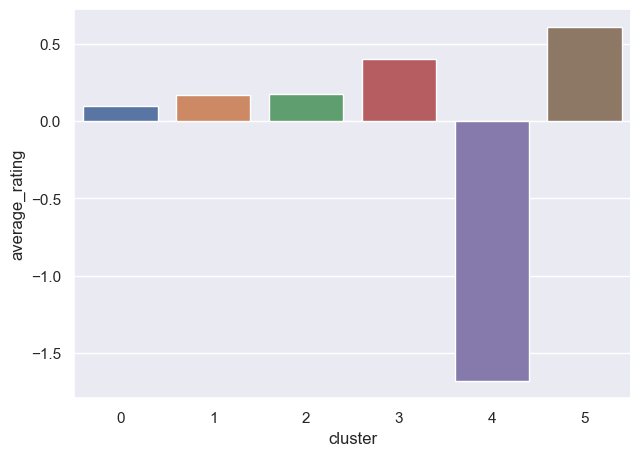

In [186]:
# The average of the 'average rating' for the 1162 books in cluster 4 is creating a negative value, this could be due to this
# cluster containing many of the lower rated books.
sns.set(font_scale=1)
sns.barplot(data = scaled_df, x = 'cluster', y = 'average_rating', ci = None);

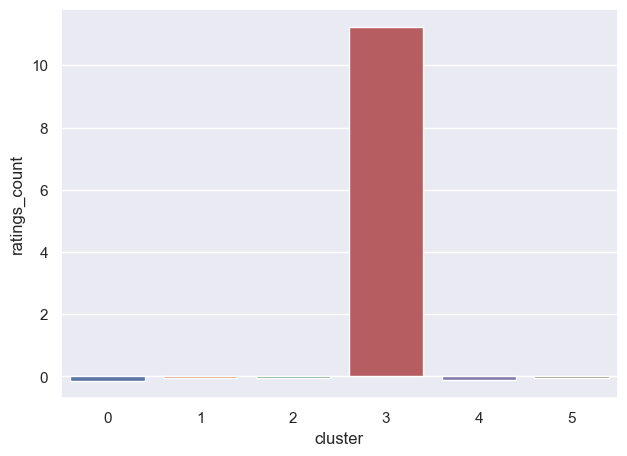

In [187]:
# It is likely that there is perhaps just 1 book with a high number of ratings in cluster 3, but due to the low number of books
# in this cluster, the impact is large.
sns.set(font_scale=1)
sns.barplot(data = scaled_df, x = 'cluster', y = 'ratings_count', ci = None);

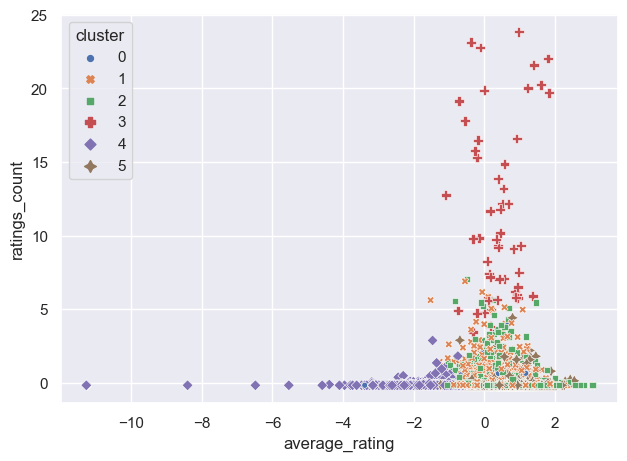

In [188]:
# We can see from the scatter plot that cluster 3 contains the most rated books.  Clusters 1 and 2 are starting to emerge.
# The rest of the clusters are harder to discern due to the range of values.

sns.set(font_scale=1)
sns.scatterplot(data = scaled_df, x = 'average_rating', y = 'ratings_count', hue = 'cluster', 
               size="cluster", palette="deep", style="cluster");

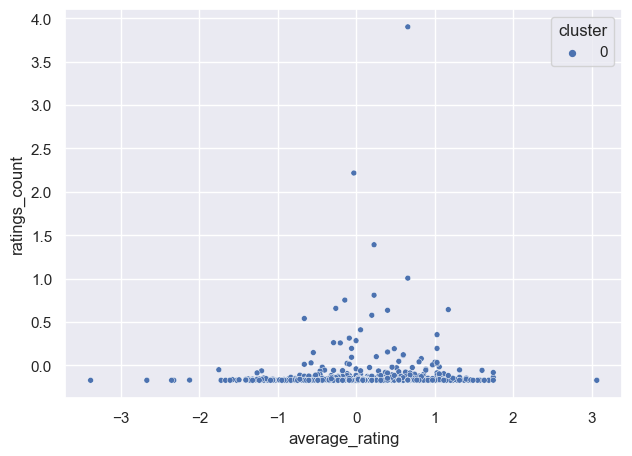

In [189]:
is_0 = scaled_df['cluster']== 0
cluster_0 = scaled_df[is_0]


#cluster_0.shape
sns.set(font_scale=1)
sns.scatterplot(data = cluster_0, x = 'average_rating', y = 'ratings_count', hue = 'cluster', 
               size="cluster", palette="deep", style="cluster");

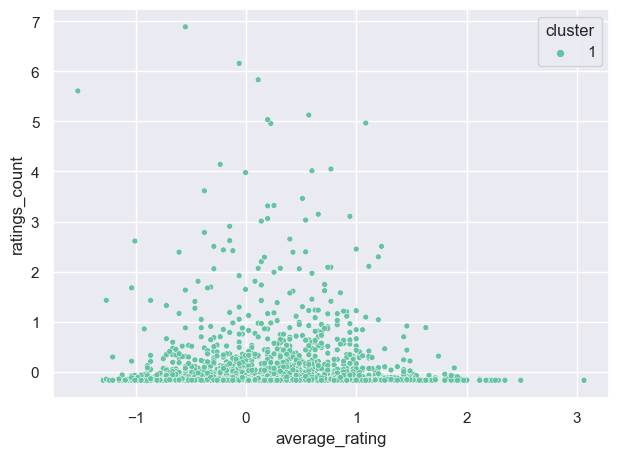

In [190]:
is_1 = scaled_df['cluster']== 1
cluster_1 = scaled_df[is_1]

#cluster_1.shape
sns.set(font_scale=1)
sns.scatterplot(data = cluster_1, x = 'average_rating', y = 'ratings_count', hue = 'cluster', 
               size="cluster", palette="BuGn", style="cluster");

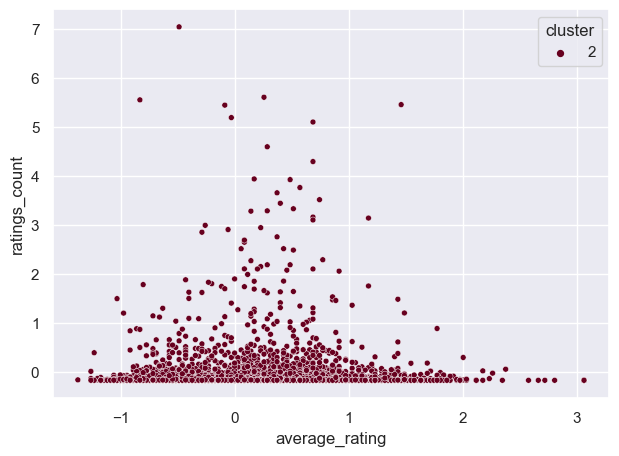

In [191]:
is_2 = scaled_df['cluster']== 2
cluster_2 = scaled_df[is_2]

#cluster_2.shape
sns.set(font_scale=1)
sns.scatterplot(data = cluster_2, x = 'average_rating', y = 'ratings_count', hue = 'cluster', 
               size="cluster", palette="RdBu", style="cluster");

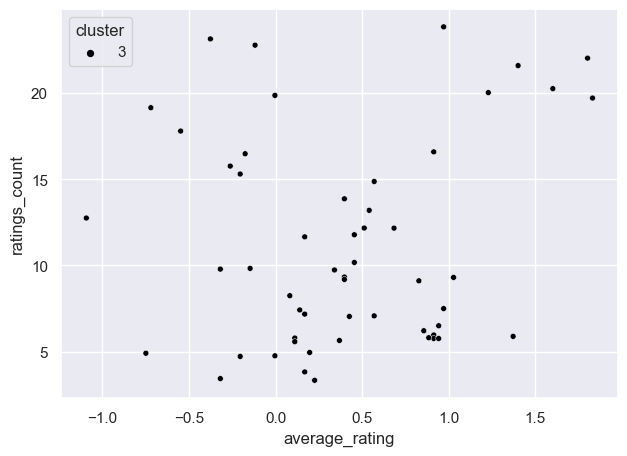

In [192]:
is_3 = scaled_df['cluster']== 3
cluster_3 = scaled_df[is_3]

#cluster_3.shape
sns.set(font_scale=1)
sns.scatterplot(data = cluster_3, x = 'average_rating', y = 'ratings_count', hue = 'cluster', 
               size="cluster", palette="magma", style="cluster");

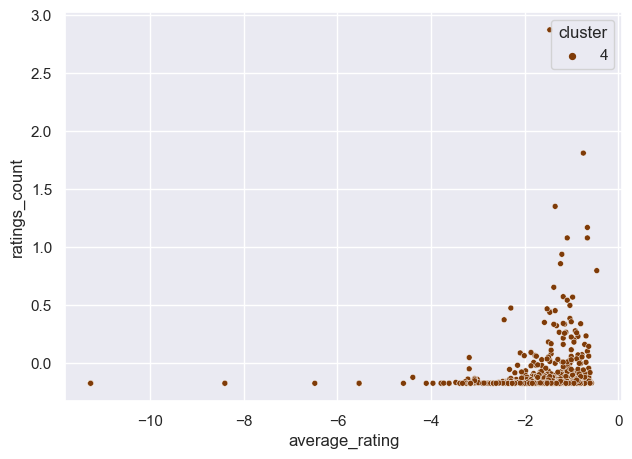

In [193]:
is_4 = scaled_df['cluster']== 4
cluster_4 = scaled_df[is_4]

#cluster_4.shape
sns.set(font_scale=1)
sns.scatterplot(data = cluster_4, x = 'average_rating', y = 'ratings_count', hue = 'cluster', 
               size="cluster", palette="PuOr", style="cluster");

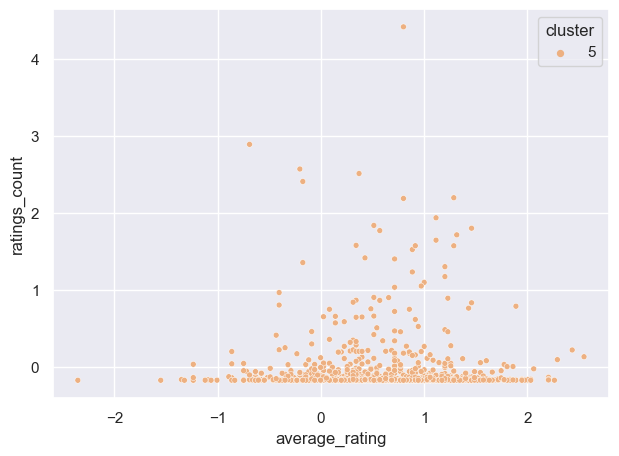

In [194]:
is_5 = scaled_df['cluster']== 5
cluster_5 = scaled_df[is_5]

#cluster_5.shape
sns.set(font_scale=1)
sns.scatterplot(data = cluster_5, x = 'average_rating', y = 'ratings_count', hue = 'cluster', 
               size="cluster", palette="flare", style="cluster");

In [ ]:
#We can see from the graphs above that the clusters are quite 'straggly' in nature

### Generalised KMeans using KMeans++
#### 'k-means++’ : selects initial cluster centers for k-mean clustering in a smart way to speed up convergence

In [195]:
# making a copy of data
Kplus_df = scaled_df

# # how many cluster do we want?  we will choose 6 to see if the results vary from the standard kmeans method
clusterNum = 6

# # Method we are using?
k_means = KMeans(init = "k-means++", n_clusters = clusterNum, random_state = 42)

# # ‘k-means++’ : selects initial cluster centers for k-mean clustering in a smart way to speed up convergence

# # fit the model 
k_means.fit(Kplus_df)

# # get the labels from the model
labels = k_means.labels_

# adding the labels as a column back to the dataset
Kplus_df["cluster_grp"] = labels
Kplus_df.head(5)

# we can see below the original cluster column from the standard K means model and the new cluster_grp column from the Kmeans++ model.
# The models have assigned the data to different clusters from each other.

,average_rating,num_pages,ratings_count,text_reviews_count,year,month,cluster,cluster_grp
0,1.831269,1.305355,19.708160,11.581333,0.717773,0.710985,3,5
1,1.601901,2.204202,20.253416,12.279492,0.471517,0.710985,3,5
2,1.401203,0.068410,-0.112538,-0.131894,0.348389,1.297607,2,0
3,1.802598,0.410632,22.021871,15.322267,0.471517,-0.462257,3,5
4,2.433362,9.708334,0.220391,-0.166160,0.471517,0.710985,5,1


In [196]:
# check the mean for all the values
Kplus_df.groupby("cluster_grp").mean().round(2)

# The cluster groups may be different but the average ratings between the 2 models are very similar.

,average_rating,num_pages,ratings_count,text_reviews_count,year,month,cluster
cluster_grp,,,,,,,
0,0.17,-0.20,-0.05,-0.05,0.22,0.89,2.00
1,0.61,2.23,-0.03,-0.03,-0.04,0.11,5.00
2,0.10,-0.17,-0.13,-0.18,-2.55,-0.11,0.00
3,-1.68,-0.27,-0.13,-0.13,0.27,-0.07,4.00
4,0.17,-0.21,-0.03,-0.02,0.25,-0.94,1.00
5,0.41,0.30,11.11,10.53,0.29,-0.26,2.98


In [161]:
# Hierarchial Clustering, below, suggest that 2 clusters is the optimal number,  therefore let's run this model 1 more time with 
# 2 clusters.

In [206]:
# making a copy of data
Kplus_df = scaled_df

# # how many cluster do we want?  we will choose 6 to see if the results vary from the standard kmeans method
clusterNum = 2

# # Method we are using?
k_means = KMeans(init = "k-means++", n_clusters = clusterNum, random_state = 42)

# # ‘k-means++’ : selects initial cluster centers for k-mean clustering in a smart way to speed up convergence

# # fit the model 
k_means.fit(Kplus_df)

# # get the labels from the model
labels = k_means.labels_

# adding the labels as a column back to the dataset
Kplus_df["cluster_grp"] = labels
Kplus_df.head(5)



,average_rating,num_pages,ratings_count,text_reviews_count,year,month,cluster,cluster_grp
0,1.831269,1.305355,19.708160,11.581333,0.717773,0.710985,3,1
1,1.601901,2.204202,20.253416,12.279492,0.471517,0.710985,3,1
2,1.401203,0.068410,-0.112538,-0.131894,0.348389,1.297607,2,0
3,1.802598,0.410632,22.021871,15.322267,0.471517,-0.462257,3,1
4,2.433362,9.708334,0.220391,-0.166160,0.471517,0.710985,5,1


In [207]:
# check the mean for all the values
Kplus_df.groupby("cluster_grp").mean().round(2)
# one cluster group is still the most prominant, which could be down to outliers but on previous anaylsis, without cutting half 
# the dataset, we looked to have removed the main ones.

,average_rating,num_pages,ratings_count,text_reviews_count,year,month,cluster
cluster_grp,,,,,,,
0,0.16,-0.20,-0.05,-0.05,-0.03,0.0,1.38
1,-0.66,0.81,0.20,0.19,0.14,-0.0,4.40


#### There are certain challenges with K-means. 
#### It always tries to make clusters of the same size. 
#### We have to decide the number of clusters at the beginning of the algorithm. Ideally, we would not know how many clusters we should have, at the beginning of the algorithm.

### Hierarchical Clustering
#### We will use Agglomerative Clustering, a type of hierarchical clustering that follows a bottom up approach. We begin by treating each data point as its own cluster. Then, we join clusters together that have the shortest distance between them to create larger clusters. This step is repeated until one large cluster is formed containing all of the data points.



In [ ]:
# In Hierarchial clustering we don't have to pre-specify the number of clusters. 
# Hierarchial clustering works well on small datasets.

In [201]:
# for plotting dendogram
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

In [202]:
# making a copy of data
hie_df = scaled_df
# calling the model
hie_clust = AgglomerativeClustering(n_clusters = None, distance_threshold=0)

# applying the model 
hie_clust.fit(hie_df)

AgglomerativeClustering(distance_threshold=0, n_clusters=None)

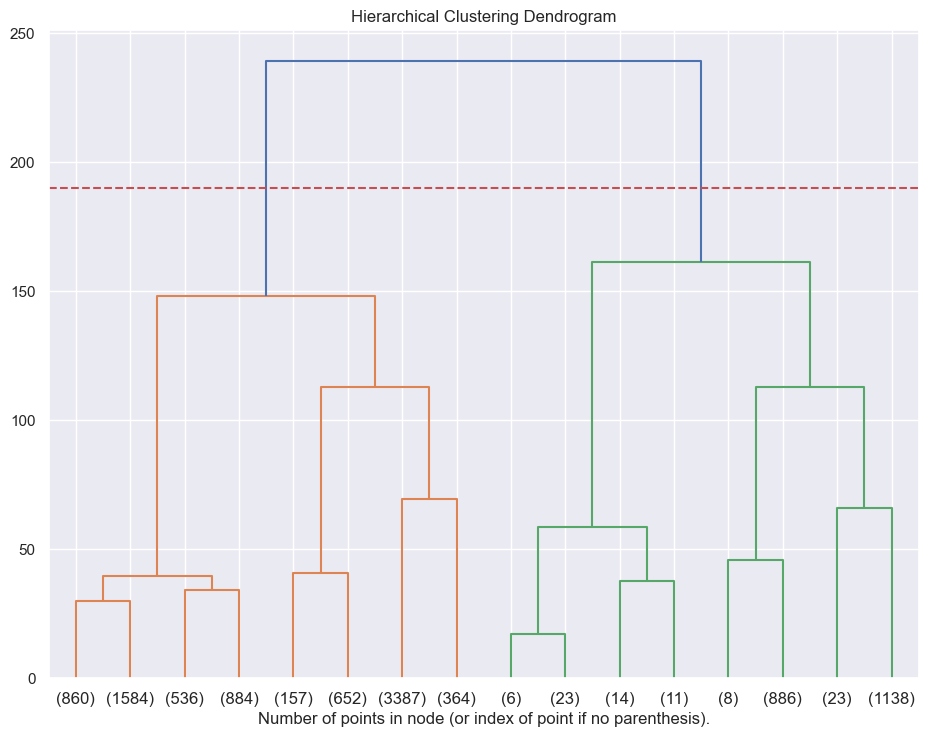

In [205]:
#  plotting the top three levels of the dendrogram
plt.figure(figsize = (10, 8))

plot_dendrogram(hie_clust, truncate_mode='level', p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.title('Hierarchical Clustering Dendrogram')

plt.axhline(y=190, color='r', linestyle='--')

plt.show()

# We can determine how many clusters to use by slicing the tallest (blue) vertical lines horizontally.  This would give us a 
# threshold of 190 on the y axis, denoted by the red line.  The number of clusters is the number of vertical lines intersected 
# by the horizontal line, which would give us just 2 clusters, which seems to denote either no clustering is possible or an 
# overfit of the model.

### Implementing the model

In [208]:
# Distance calculation method = euclidean (as the crow flies), and linkage = Ward, which analyses the variance of clusters
# 2 clusters seems too few, therefore will revert back to the 6 clusters given by Kmeans

cluster = AgglomerativeClustering(n_clusters=6, affinity='euclidean', linkage='ward')  
cluster.fit_predict(hie_df)

array([2, 2, 0, ..., 4, 0, 5], dtype=int64)

### Visualising the clusters

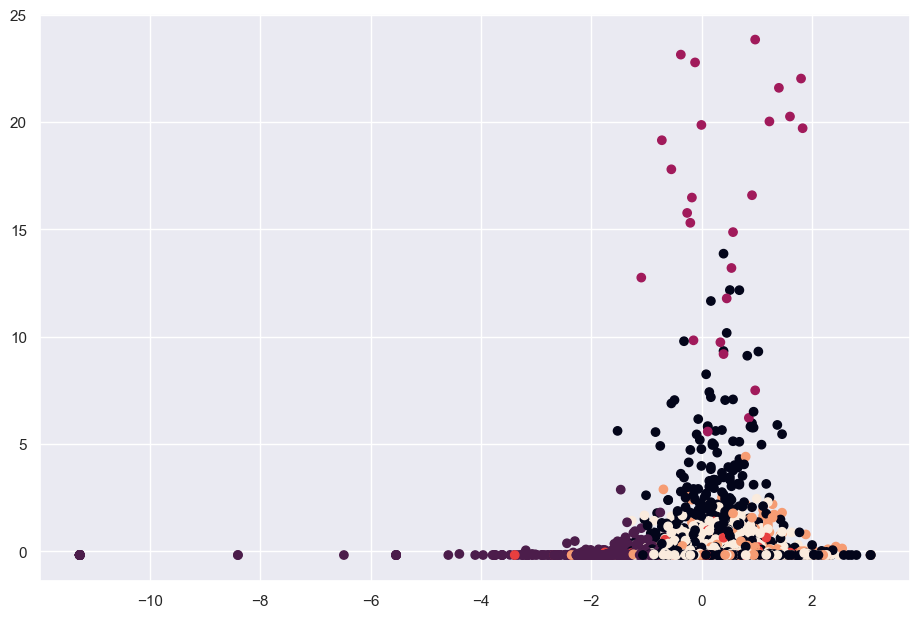

In [209]:
plt.figure(figsize=(10, 7))  
plt.scatter(hie_df['average_rating'], hie_df['ratings_count'], c=cluster.labels_) 

# As we can see, the clusters are still not clearly defined, however, it could be that we need to view them in a 3D model.

#### We have used 3 different methods to calculate the optimal number of clusters, none of which have given us a definitive answer, which may be down to a shortfall in the data set in terms of missing columns, such as genre, to help with the groupings.  We will still endeavour to develop a book recommender.

<a id="8"></a>
# <p style="padding:10px;background-color:#ffffff;margin:0;color:#78eab5;font-family:Courier New;font-size:120%;text-align:left;border-radius: 15px 50px;overflow:hidden;font-weight:1000"> Recommender </p>

### Using the Nearest Neighbors Model to implement a neighbors search
##### K will equal 6 which is the optimal number of clusters intimated by KMeans

In [210]:
# remove cluster columns from scaled_df
drop_clust = ['cluster','cluster_grp']
scale_df = scaled_df.drop(columns = drop_clust)

# initiating the model and fitting to the data
nn = NearestNeighbors(n_neighbors=6)

nn.fit(scale_df)
distance, indices = nn.kneighbors(scale_df)

### Testing the model to generate predictions

In [211]:
#drop 2 columns as the mod_auth_df dataframe and standard scaler had differing numbers of int and float
drop_col = ['bookID','language_code']
books = mod_auth_df.drop(columns = drop_col)
select_book = books.query("title == 'The Hobbit' ").select_dtypes(['int', 'float'])

In [212]:
select_book_scaled = scaler.transform(select_book)

In [213]:
select_book_scaled

array([[ 0.97113683, -0.2408259 , -0.14213555, -0.09548706,  0.84090126,
         0.71098525]])

In [214]:
select_book_scaled = pd.DataFrame(select_book_scaled, columns = select_book.columns)

In [215]:
select_book_scaled
# the test model generates 1 prediction

,average_rating,num_pages,ratings_count,text_reviews_count,year,month
0,0.971137,-0.240826,-0.142136,-0.095487,0.840901,0.710985


### Getting the recommendations

In [216]:
nn.kneighbors(select_book_scaled,  return_distance=True)
#based on 6 nearest neighbours. Top row is distance from book (0 is the song) and bottom row is the positions of the books

(array([[0.        , 0.21617456, 0.24656104, 0.24678983, 0.31811606,
         0.32152914]]),
 array([[ 1614, 10485,  5571,  8595,  4288,  2347]], dtype=int64))

In [217]:
# get only the array values
nn.kneighbors(select_book_scaled,  return_distance=True)[1:]

(array([[ 1614, 10485,  5571,  8595,  4288,  2347]], dtype=int64),)

In [218]:
nn.kneighbors(select_book_scaled,  return_distance=False)[:]

array([[ 1614, 10485,  5571,  8595,  4288,  2347]], dtype=int64)

#### Ignore the first recommendation as that is the book itself

In [219]:
recco_list = nn.kneighbors(select_book_scaled,  return_distance=False)[:,1:].tolist()[0]

In [220]:
recco_list  #row number of books

[10485, 5571, 8595, 4288, 2347]

In [221]:
df.loc[recco_list,['title']]

,title
10485,Hemingway vs. Fitzgerald
5571,Ewan McGregor: From Junkie to Jedi
8595,North Carolina Weekends
4288,Up in a Heaval (Xanth #26)
2347,Driving Force


In [ ]:
# I'm not sure how accurate this recommender is but it's basing it on the average rating and it's nearest neighbours.
# The dataset, perhaps, needs some further fine tuning to make it more accurate.

### Creating specific functions to help in finding the book names:

##### . Get ID from partial name 
##### . Print the similar books from the feature dataset, using the Indices metric from the nearest neighbors to pick the books.

In [222]:
def get_index_from_name(name):
    return mod_auth_df[df["title"]==name].index.tolist()[0]

all_books_names = list(mod_auth_df.title.values)

def get_id_from_partial_name(partial):
    for name in all_books_names:
        if partial in name:
            print(name,all_books_names.index(name))
            
def print_similar_books(query=None,id=None):
    if id:
        for id in indices[id][1:]:
            print(df.iloc[id]["title"])
    if query:
        found_id = get_index_from_name(query)
        for id in indices[found_id][1:]:
            print(df.iloc[id]["title"])

### Testing our search functions

In [223]:
get_id_from_partial_name("Harry Potter and the ")

Harry Potter and the Half-Blood Prince (Harry Potter  #6) 0
Harry Potter and the Order of the Phoenix (Harry Potter  #5) 1
Harry Potter and the Chamber of Secrets (Harry Potter  #2) 2
Harry Potter and the Prisoner of Azkaban (Harry Potter  #3) 3
Harry Potter and the Half-Blood Prince (Harry Potter  #6) 0
Harry Potter and the Prisoner of Azkaban (Harry Potter  #3) 3
Harry Potter and the Chamber of Secrets (Harry Potter  #2) 2
Harry Potter and the Sorcerer's Stone (Harry Potter  #1) 8399
Harry Potter and the Goblet of Fire (Harry Potter  #4) 10130


In [224]:
get_id_from_partial_name("J.K. Rowling")

J.K. Rowling's Harry Potter Novels: A Reader's Guide 578
J.K. Rowling - A Biography 9818


In [225]:
print_similar_books("Hamlet")

On Christian Doctrine
Electra and Other Plays
Three Famous Short Novels: Spotted Horses Old Man the Bear
The Stars  Like Dust (Galactic Empire  #1)
Gemma Alone (Gemma  #3)


In [226]:
print_similar_books("Jane Eyre")

The Journals of Ayn Rand
The Naked and the Dead
Patriot Games (Jack Ryan  #1)
Philosophy Made Simple
Street of the Five Moons (Vicky Bliss  #2)


In [ ]:
# some interesting suggestions, again, probably due to clustering not being particularly accurate.

<a id="9"></a>
# <p style="padding:10px;background-color:#ffffff;margin:0;color:#78eab5;font-family:Courier New;font-size:120%;text-align:left;border-radius: 15px 50px;overflow:hidden;font-weight:1000"> Streamlit </p>

#### Creating a recommender app in Streamlit

In [227]:
filename = 'nn_model_prediction.sav' # name of the file 
pickle.dump(nn, open(filename, 'wb')) # exporting the file

print("file exported")

file exported
